In [2]:
import os
import numpy as np
import pandas as pd
from pathlib import Path
import matplotlib.pyplot as plt
import datetime

import torch
from torch.utils.data import DataLoader

import snntorch as snn

from models import get_model
from datasets import MNISTSequencesDataset, NormaliseToZeroOneRange

from SNNCustomConfig import SNNCustomConfig

Matplotlib created a temporary cache directory at /tmp/matplotlib-dvezsrb7 because the default path (/home/jupyter-ikharitonov/.cache/matplotlib) is not a writable directory; it is highly recommended to set the MPLCONFIGDIR environment variable to a writable directory, in particular to speed up the import of Matplotlib and to better support multiprocessing.


In [3]:
# Setting random seeds
torch.manual_seed(0)
np.random.seed(0)

In [4]:
def run(model_name='SNN1', dataset_name='mnist_sequences_250hz', configuration_name='config8_rheobase_1', data_multiplier=1, rheo_multiplier=0.13):
    
    config = SNNCustomConfig(model_name=model_name, dataset_name=dataset_name,
                             configuration_name=configuration_name, continue_training=True)
    data_multiplier = data_multiplier * rheo_multiplier

    device = torch.device(config.params["torch_device"])
    ingest_torch_dtype = torch.uint8
    ingest_numpy_dtype = np.uint8

    dtype = torch.float32

    tao_mem = config.params["membrane_time_constant_tao"] # 10ms membrane time constant
    timestep = 1/config.params["dataset_sampling_frequency"]
    beta = np.exp(-timestep / tao_mem)
    alpha = 1

    # Data ingest and network initialisation
    normalise_transform = NormaliseToZeroOneRange(dtype=dtype)
    mnist_dataset = MNISTSequencesDataset(config.dirs["training"], config.params["LIF_linear_features"], ingest_numpy_dtype, ingest_torch_dtype, transform=normalise_transform)
    train_loader = DataLoader(mnist_dataset, batch_size=config.params["batch_size"], shuffle=True, num_workers=config.params["dataloader_num_workers"])

    config.data_shape = next(iter(train_loader)).shape

    model_class = get_model(config.model_name)
    model = model_class(num_steps=config.data_shape[1], beta=beta, alpha=alpha, LIF_linear_features=config.params["LIF_linear_features"], reset_mechanism=config.params["reset_mechanism"], dtype=dtype).to(device).to(dtype)

    optimizer = config.get_optimizer(model)
    scheduler = config.get_scheduler(optimizer)

    current_dir = config.weights_save_dir/config.configuration_name

    # specific_weights_file = config.weights_save_dir / config.configuration_name / 'SNN1_mnist_sequences_250hz_i_0_epoch_1_loss_0.063.pth'
    specific_weights_file = None
    model, optimizer, checkpoint = config.iteration_begin_step(model, optimizer, specify_weights_file=specific_weights_file)
    loss_hist = checkpoint['loss_history']

    print(f"{config.data_shape[0]/config.params['batch_size']} iterations per epoch.")

    ####################################################################################

    # %matplotlib widget
    fig,ax = plt.subplots(nrows=1, ncols=3, facecolor="w", figsize=(30, 5))
    ax[0].plot(loss_hist)
    ax[0].set_title("Loss Curves")
    ax[0].legend(["Train Loss"])
    ax[0].set_xlabel("Iteration")
    ax[0].set_ylabel("Loss")
    # plt.xlim([0,500])
    # plt.savefig()

    lr_df = pd.read_csv(current_dir/'lr_metrics.csv', skiprows=1)
    ax[1].set_title("Learning rate schedule")
    ax[1].plot(lr_df["lr"])
    ax[1].set_xlabel("Iteration")
    ax[1].set_ylabel("Learning rate")

    ax[2].set_title("Learning rate schedule (log y-axis)")
    ax[2].plot(lr_df["lr"])
    ax[2].set_yscale('log')
    ax[2].set_xlabel("Iteration")
    ax[2].set_ylabel("Learning rate")

    plt.show()

    ####################################################################################

    plt.figure(figsize=(10,10))
    plt.imshow(model.lif1.recurrent.weight.data.cpu().numpy())
    print('mean',model.lif1.recurrent.weight.data.mean())
    print('std',model.lif1.recurrent.weight.data.std())
    print('max',model.lif1.recurrent.weight.data.max())
    print('min',model.lif1.recurrent.weight.data.min())
    plt.colorbar()
    plt.show()

    ####################################################################################

    print('connectivity of unit 350')
    plt.figure(figsize=(14,8))
    # plt.plot(model.lif1.recurrent.weight.data.cpu().numpy()[:,350])
    plt.imshow(model.lif1.recurrent.weight.data.cpu().numpy()[:,350].reshape((28,28)))
    plt.show()

    ####################################################################################

    old_weights = model.lif1.recurrent.weight.data.detach().cpu().numpy().copy()

    plt.title('weight matrix histogram')
    plt.hist(old_weights.flatten(), bins=50)
    plt.show()

    ####################################################################################

    batch_size = config.params["batch_size"]
    batch_data_shape = config.data_shape

    random_data = next(iter(train_loader)).to(device)

    model.eval()

    spk_rec, mem_rec = model(random_data * data_multiplier)

    dim_size = int(config.params["LIF_linear_features"]**0.5)

    arr1 = random_data[:,:,:].reshape((batch_size,batch_data_shape[1],dim_size,dim_size)).detach().cpu().numpy()[0,:,:,:]
    arr2 = mem_rec.reshape((batch_size,batch_data_shape[1],dim_size,dim_size)).detach().cpu().numpy()[0,:,:,:]
    arr3 = spk_rec.reshape((batch_size,batch_data_shape[1],dim_size,dim_size)).detach().cpu().numpy()[0,:,:,:]

    ####################################################################################

    plt.title('input')
    plt.figure(figsize=(12,10))
    # plt.plot(random_data[0,:,27].detach().cpu().numpy())
    # plt.plot(random_data[0,:,551].detach().cpu().numpy())
    plt.plot(random_data[0,:,:].detach().cpu().numpy())

    plt.title('input unit 350')
    plt.plot(random_data[0,:,350].detach().cpu().numpy())
    plt.show()

    ####################################################################################

    plt.figure(figsize=(12,10))
    plt.title('membrane voltage')
    # plt.plot(mem_rec[0,:,27].detach().cpu().numpy())
    # plt.plot(mem_rec[0,:,400].detach().cpu().numpy())
    plt.plot(mem_rec[0,:,:].detach().cpu().numpy())
    # plt.xlim([100,400])
    # plt.xlim([300,600])
    # plt.xlim([600,800])
    plt.show()

    ####################################################################################

    plt.figure(figsize=(12,10))
    plt.title('spikes')
    # plt.plot(spk_rec[0,:,500].detach().cpu().numpy())
    plt.plot(spk_rec[0,:,:].detach().cpu().numpy())
    # plt.xlim([600,800])
    # plt.xlim([300,600])
    plt.show()

    ####################################################################################

    spk_freqs = [len(np.where(spk_rec[0,:,i].detach().cpu().numpy()==1)[0]) for i in range(784)]
    plt.hist(spk_freqs, bins=50)
    plt.xlabel('number of spikes produced by a unit over the sequence')
    plt.ylabel('number of units')
    plt.title(config.configuration_name)
    plt.show()

    ####################################################################################

    digit_duration = 0.5 # seconds
    in_between_digit_period = 0.5 # seconds
    number_of_digits = 10
    sampling_freq = 250 # Hz

    total_time = number_of_digits * digit_duration + (number_of_digits + 1) * in_between_digit_period
    t = np.linspace(0, total_time, int(total_time*sampling_freq))
    spkt_tims = [list(t[np.where(spk_rec[0,:,i].detach().cpu().numpy()==1)]) for i in range(784)]

    plt.figure(figsize=(12,10))
    plt.eventplot(spkt_tims)
    # plt.xlim([1.8, 1.82])
    plt.show()

# config8_rheobase_1

ConfigParser: Loading configuration from config8_rheobase_1.txt
Continuing training from file: /home/jupyter-ikharitonov/RANCZLAB-NAS/iakov/produced/mnist_sequence_checkpoints/SNN1_mnist_sequences_250hz/config8_rheobase_1/SNN1_mnist_sequences_250hz_i_0_epoch_100_loss_0.057.pth | starting epoch: 101
615,440 total parameters.
615,440 trainable parameters.
1.0 iterations per epoch.


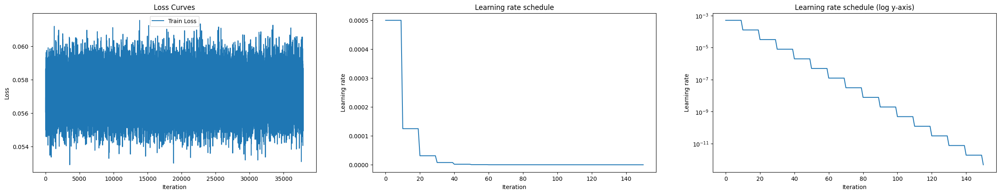

mean tensor(-6.3584e-05, device='cuda:0')
std tensor(0.0003, device='cuda:0')
max tensor(0.0019, device='cuda:0')
min tensor(-0.0063, device='cuda:0')


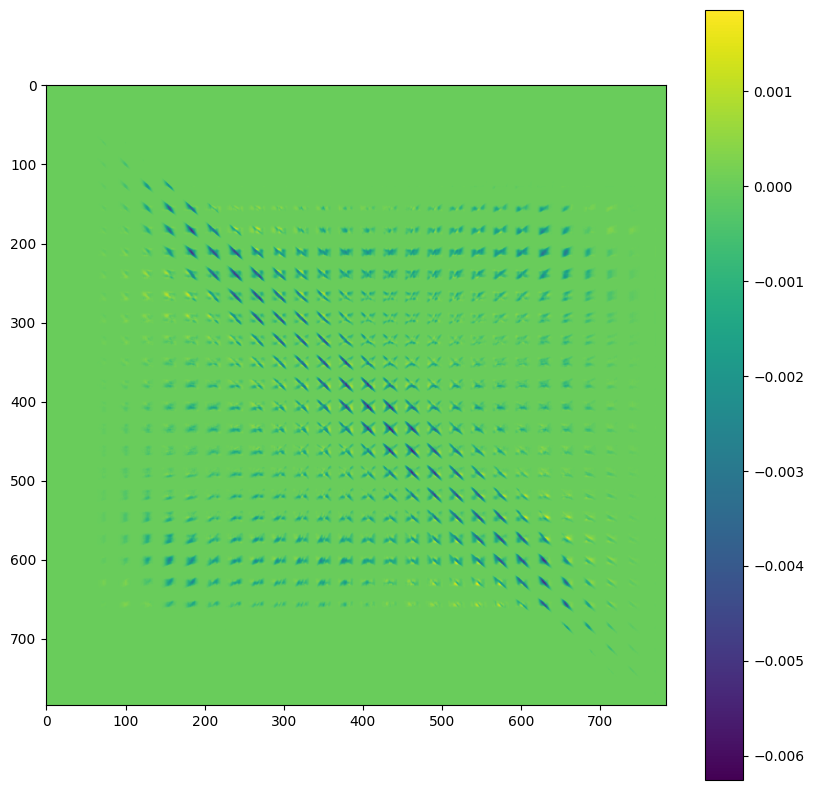

connectivity of unit 350


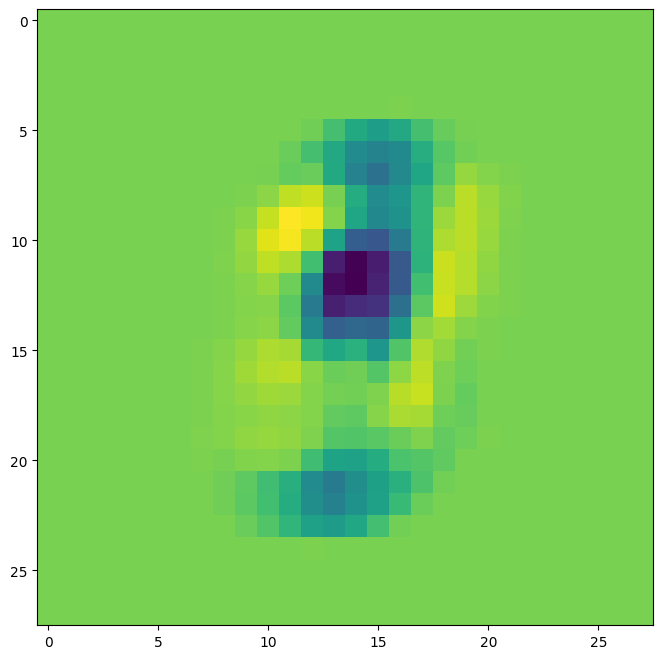

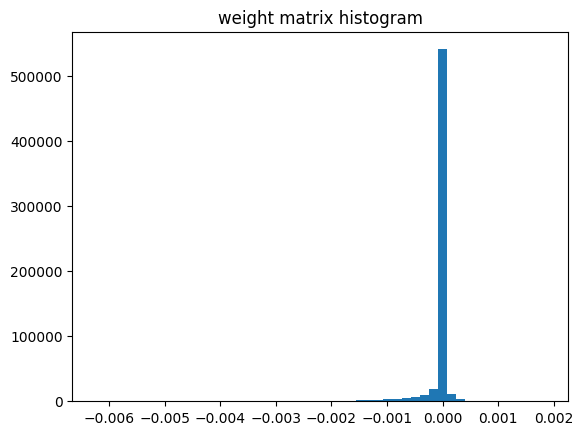

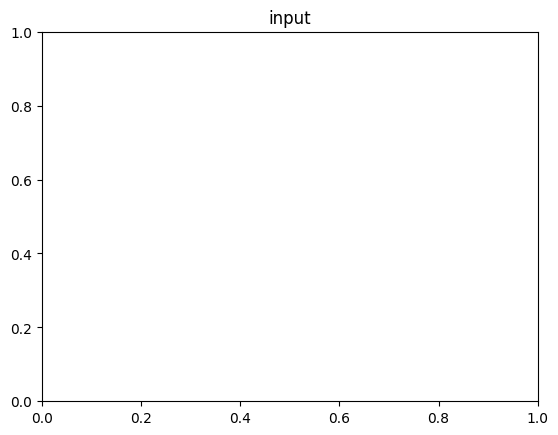

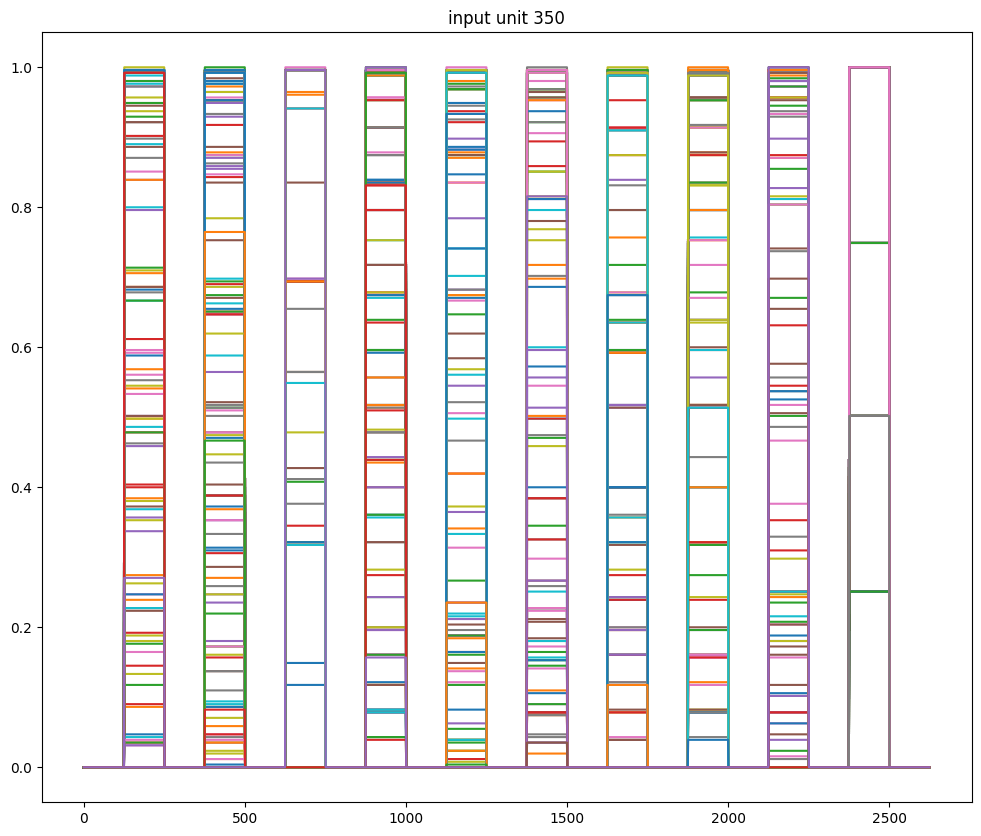

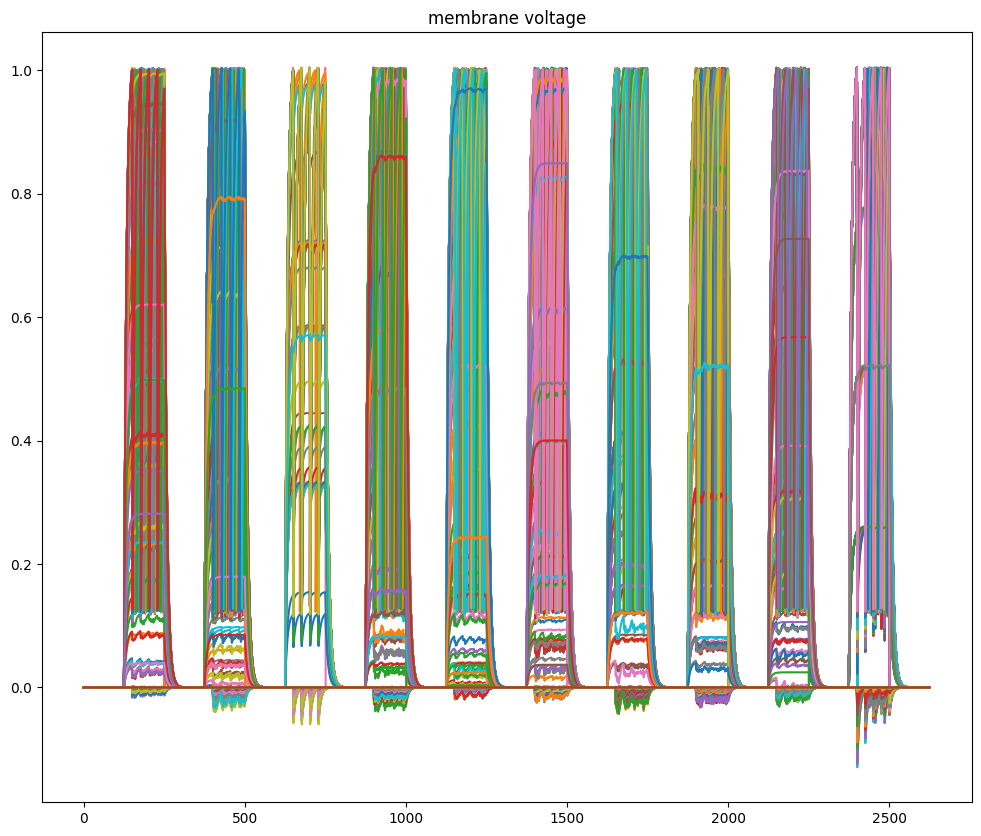

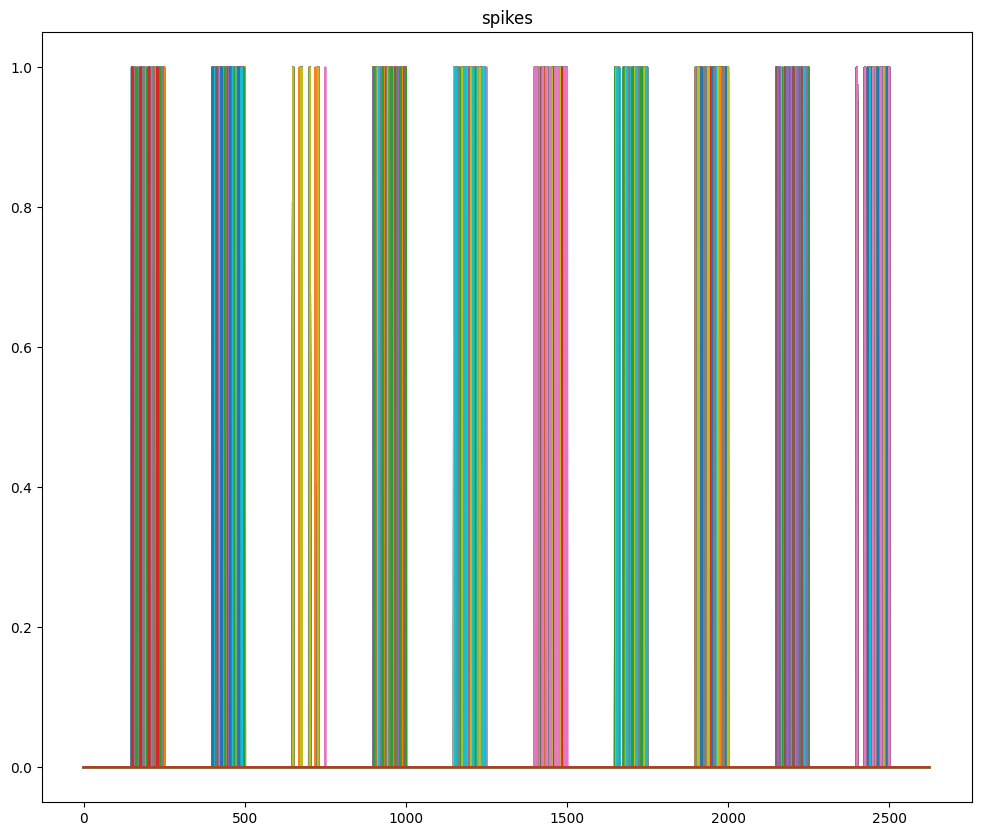

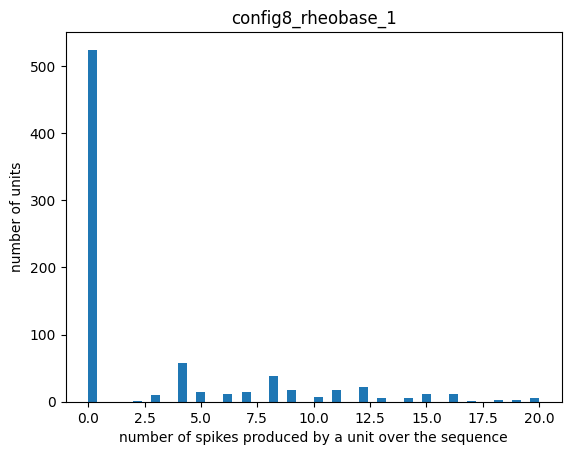

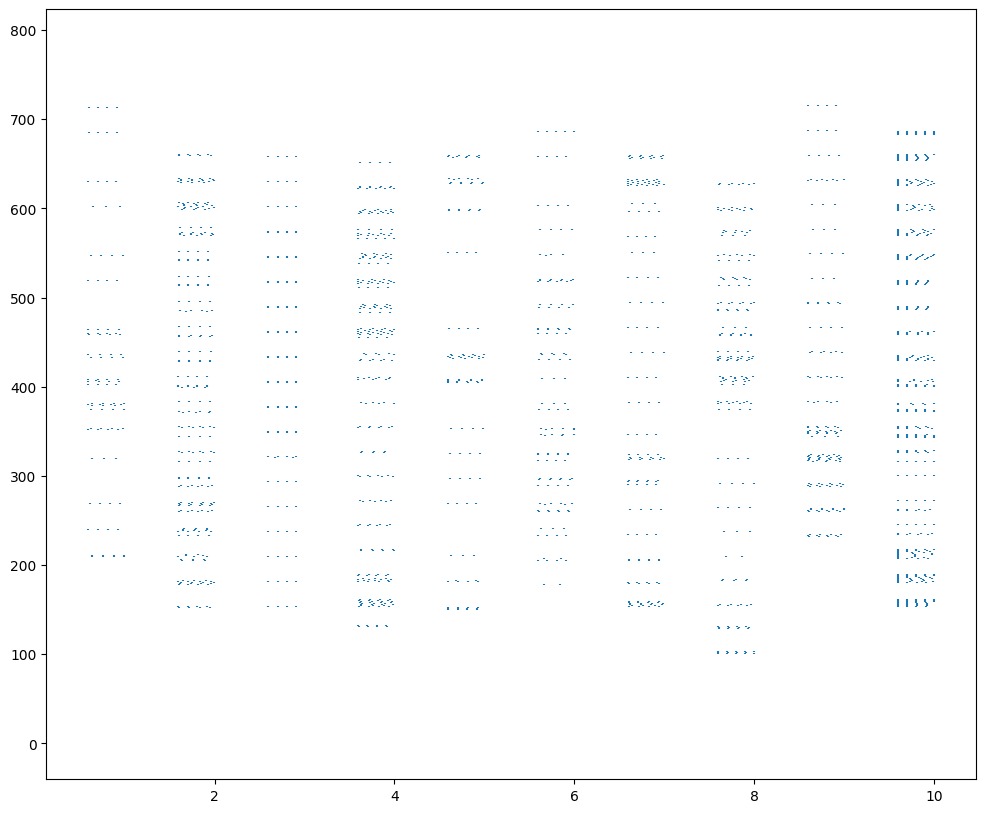

In [5]:
run(dataset_name='mnist_sequences_250hz', configuration_name='config8_rheobase_1', data_multiplier=1)

# config32_rheo1

ConfigParser: Loading configuration from config32_rheo1.txt
Continuing training from file: /home/jupyter-ikharitonov/RANCZLAB-NAS/iakov/produced/mnist_sequence_checkpoints/SNN1_mnist_sequences_250hz/config32_rheo1/SNN1_mnist_sequences_250hz_i_0_epoch_9_loss_0.058.pth | starting epoch: 10
615,440 total parameters.
615,440 trainable parameters.
1.0 iterations per epoch.


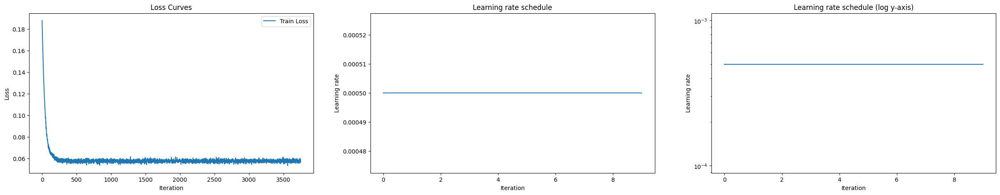

mean tensor(-7.1805e-05, device='cuda:0')
std tensor(0.0004, device='cuda:0')
max tensor(0.0025, device='cuda:0')
min tensor(-0.0064, device='cuda:0')


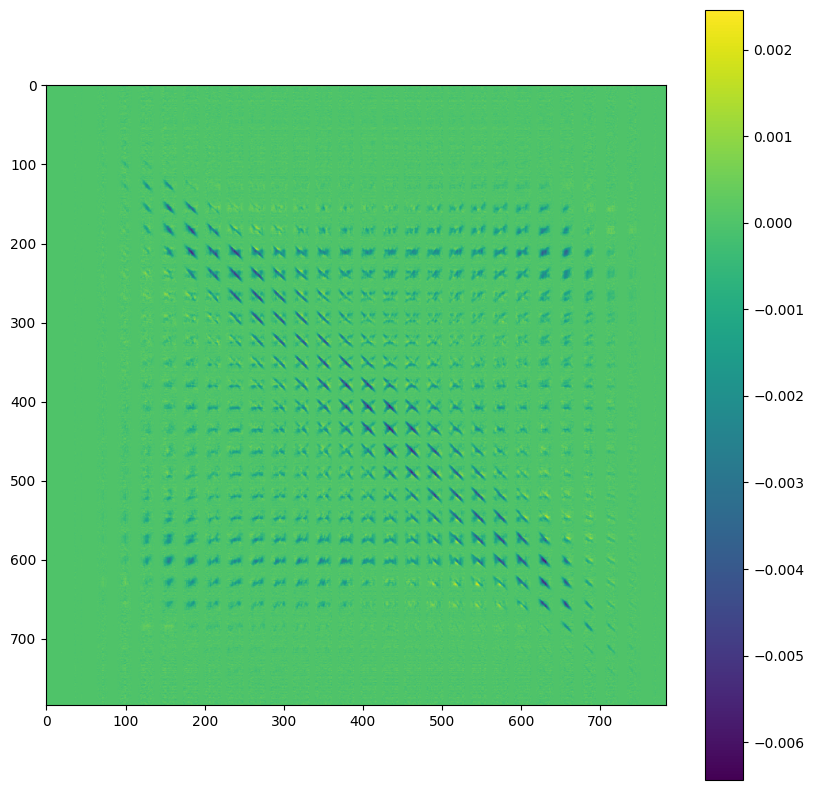

connectivity of unit 350


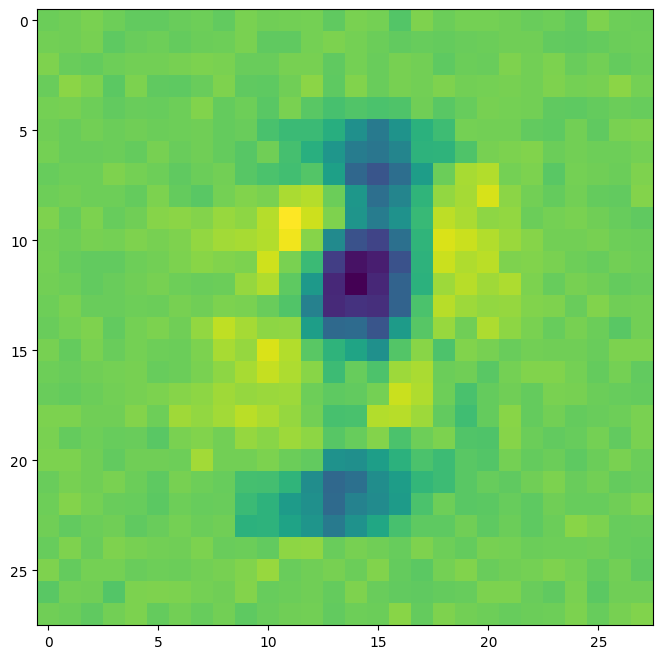

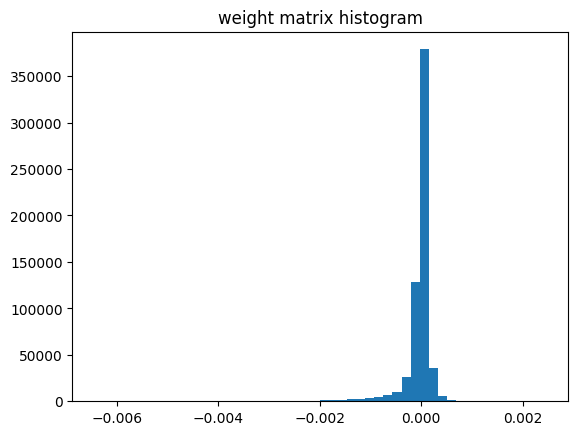

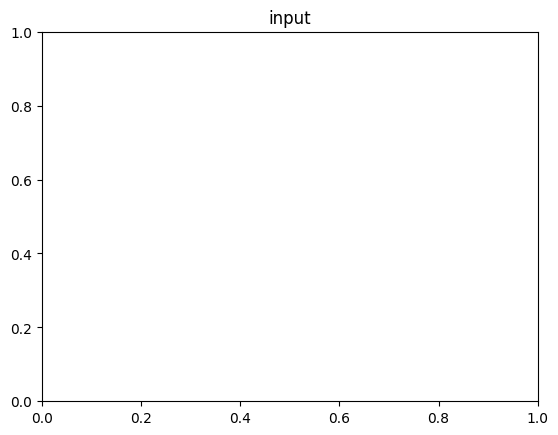

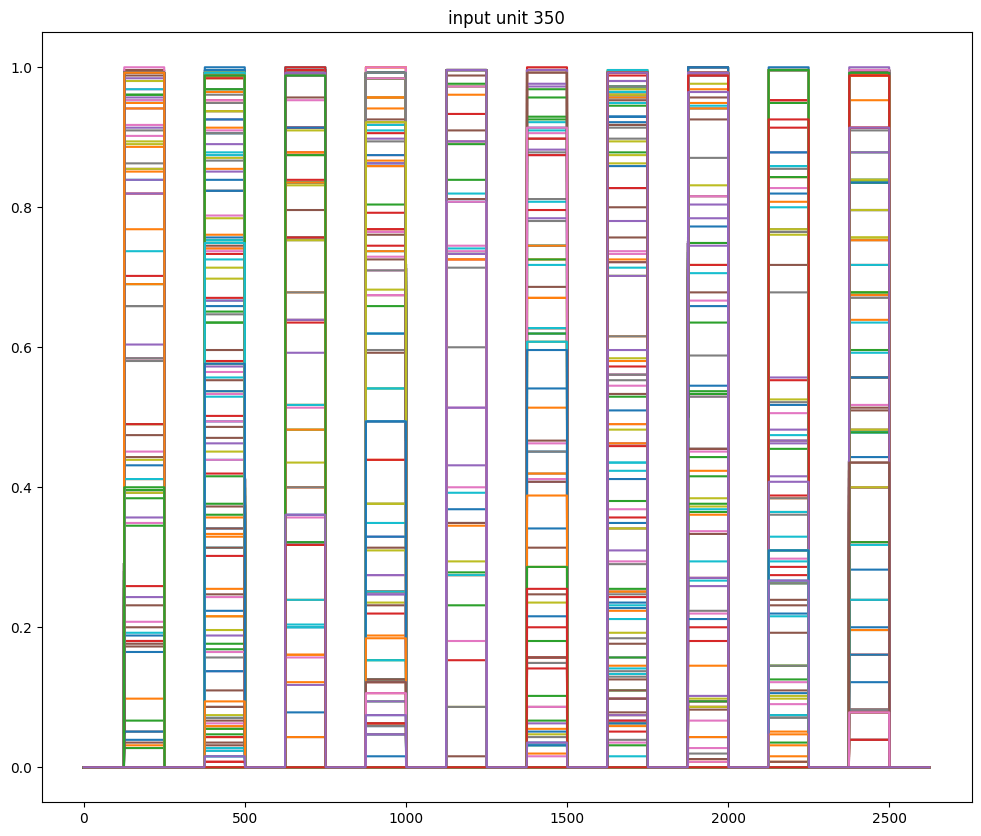

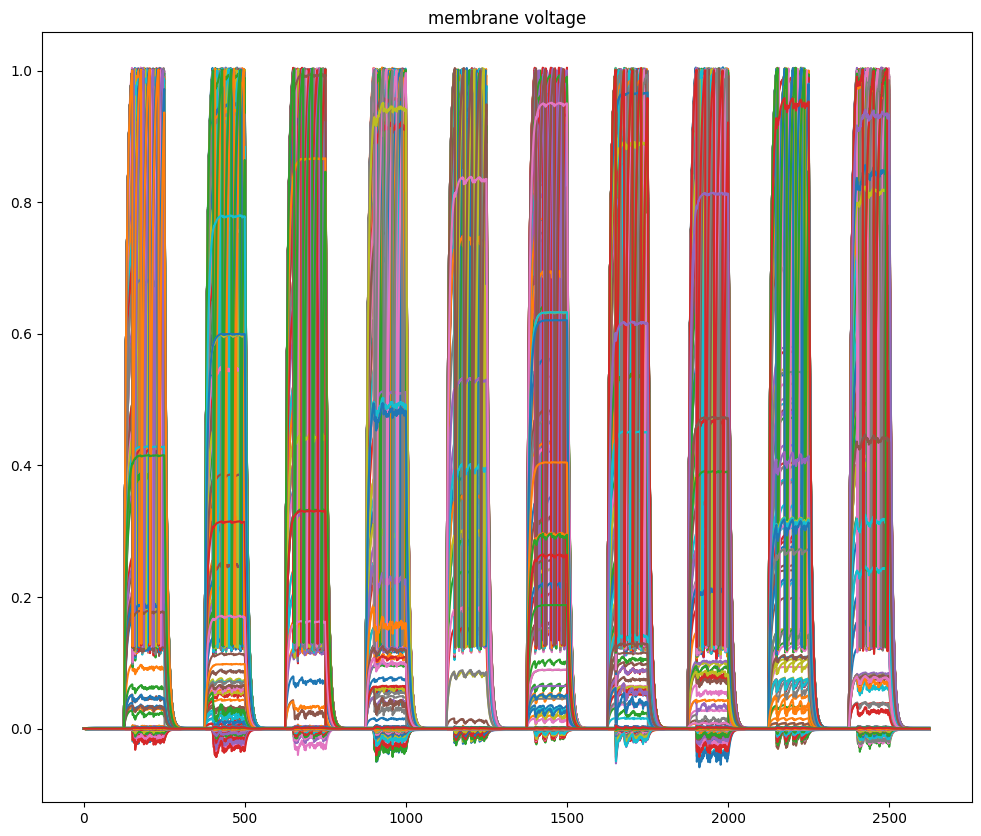

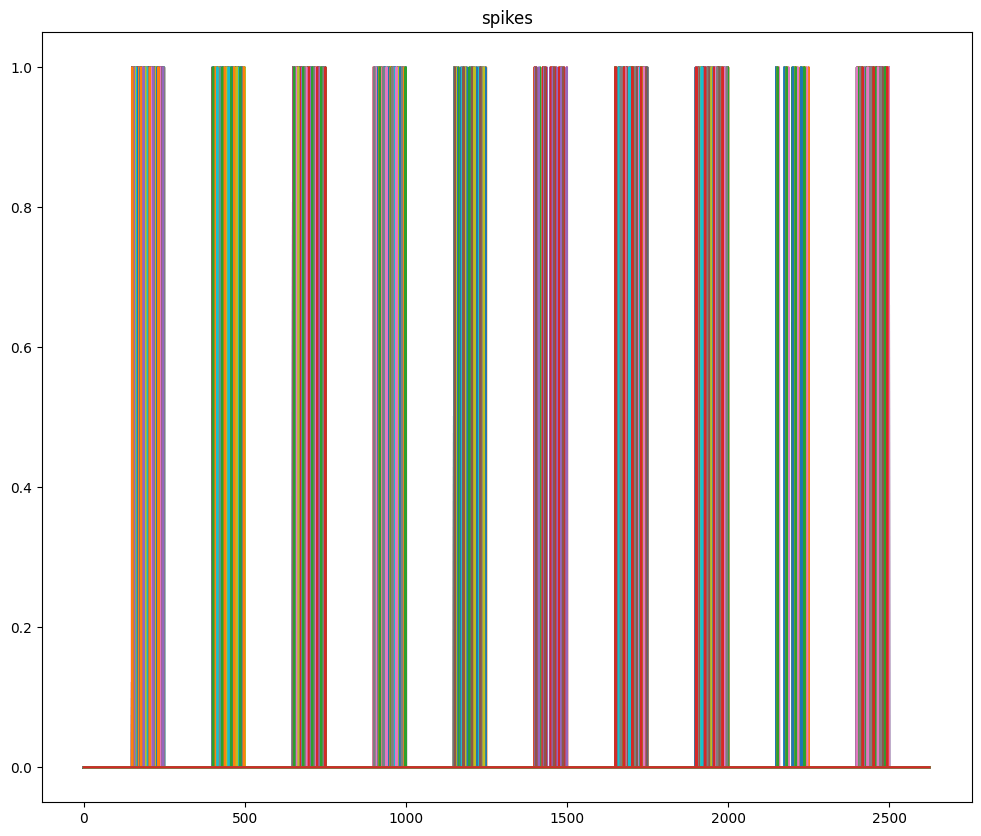

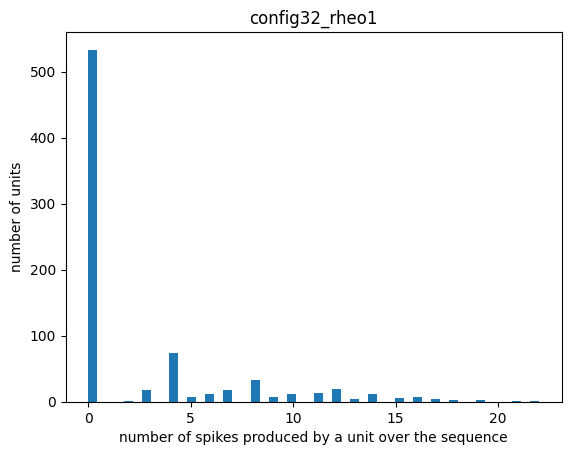

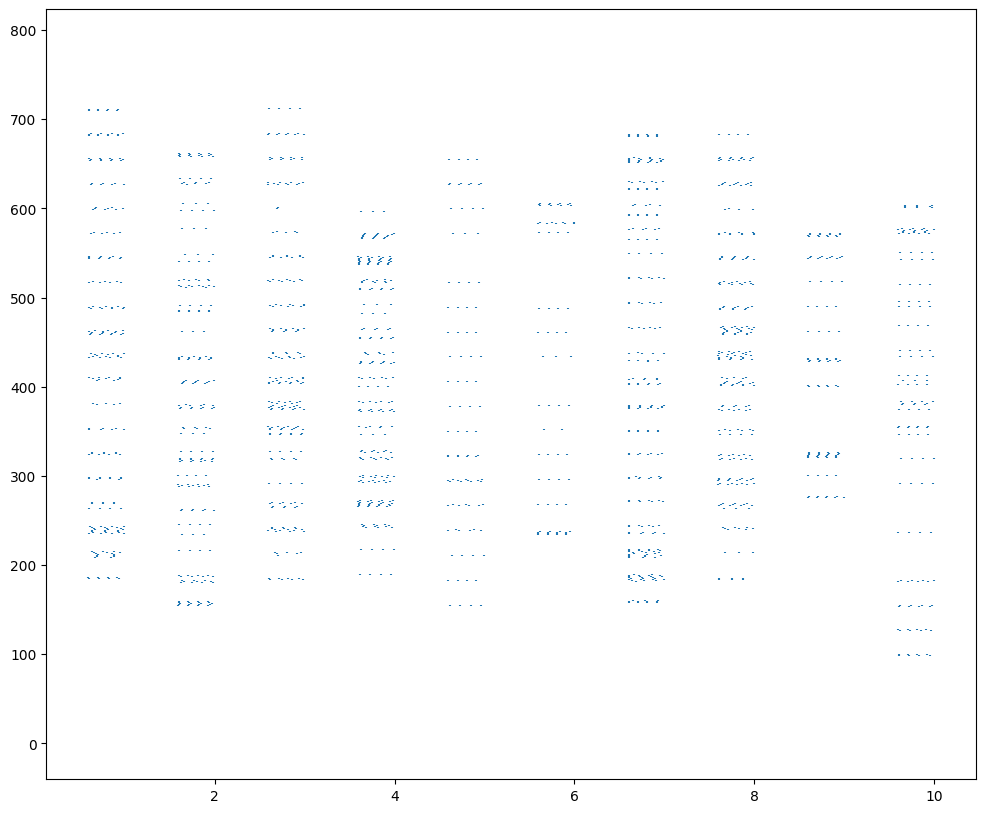

In [6]:
run(dataset_name='mnist_sequences_250hz', configuration_name='config32_rheo1', data_multiplier=1)

# config31_rheo0.98

ConfigParser: Loading configuration from config31_rheo0.98.txt
Continuing training from file: /home/jupyter-ikharitonov/RANCZLAB-NAS/iakov/produced/mnist_sequence_checkpoints/SNN1_mnist_sequences_250hz/config31_rheo0.98/SNN1_mnist_sequences_250hz_i_0_epoch_10_loss_0.059.pth | starting epoch: 11
615,440 total parameters.
615,440 trainable parameters.
1.0 iterations per epoch.


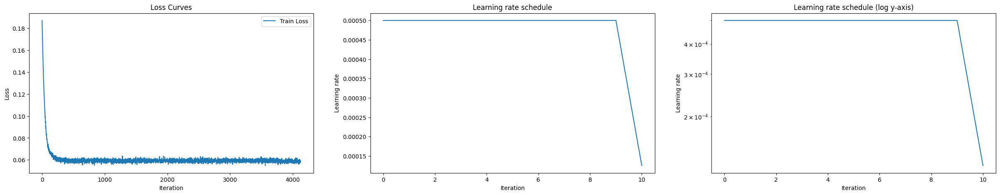

mean tensor(-5.1232e-05, device='cuda:0')
std tensor(0.0003, device='cuda:0')
max tensor(0.0013, device='cuda:0')
min tensor(-0.0046, device='cuda:0')


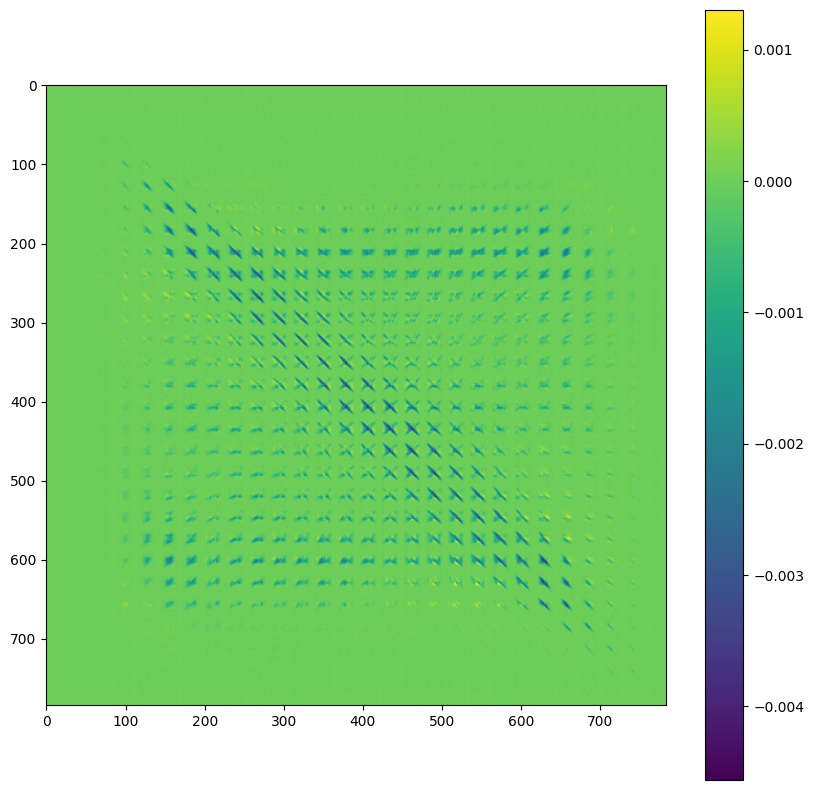

connectivity of unit 350


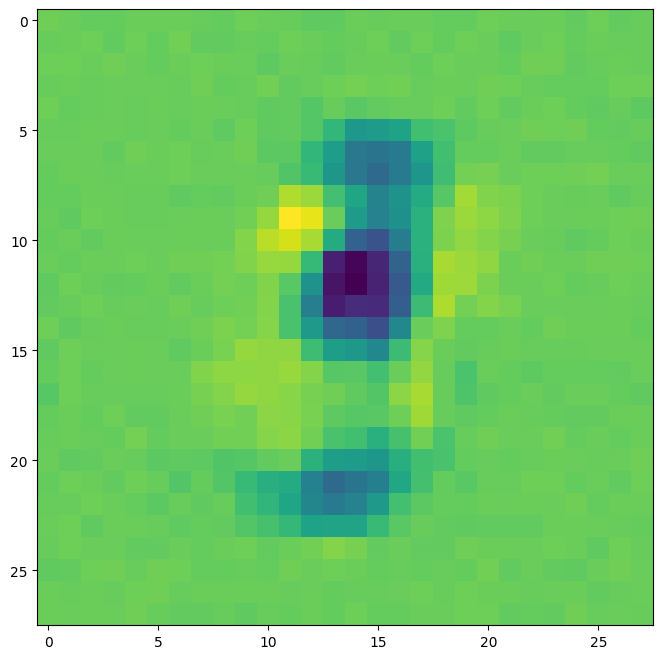

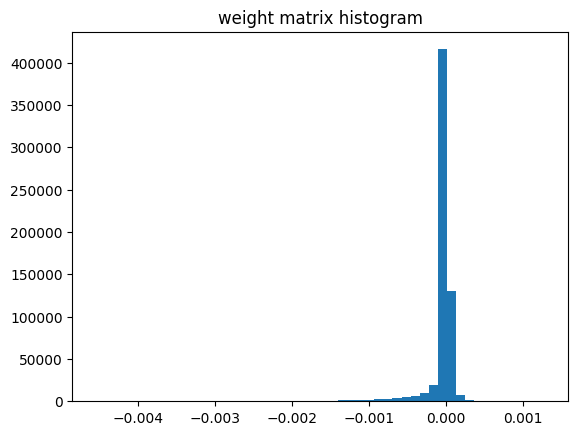

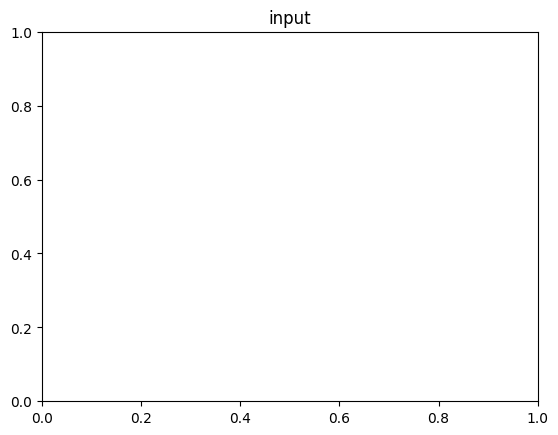

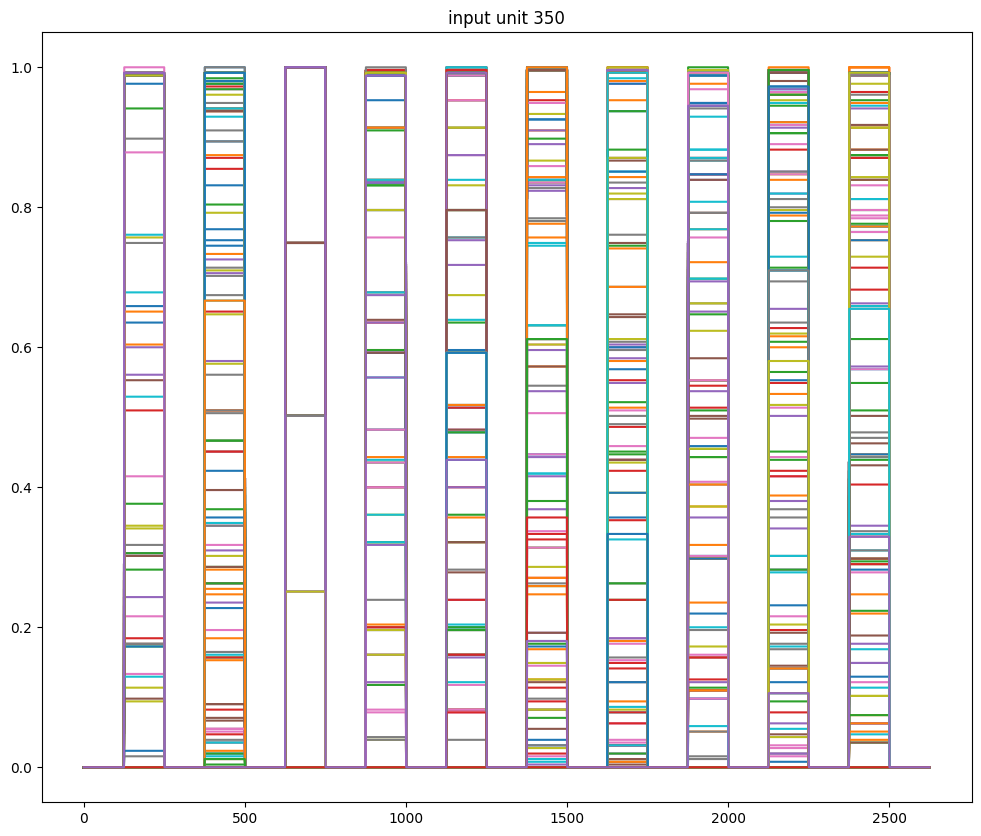

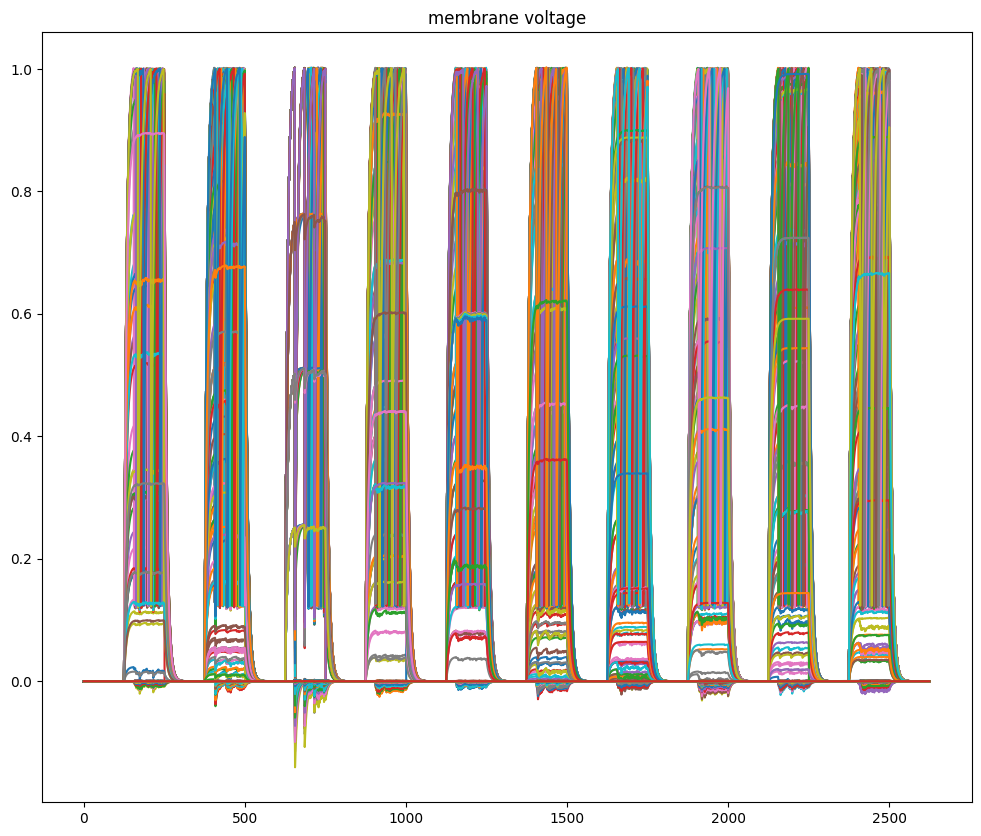

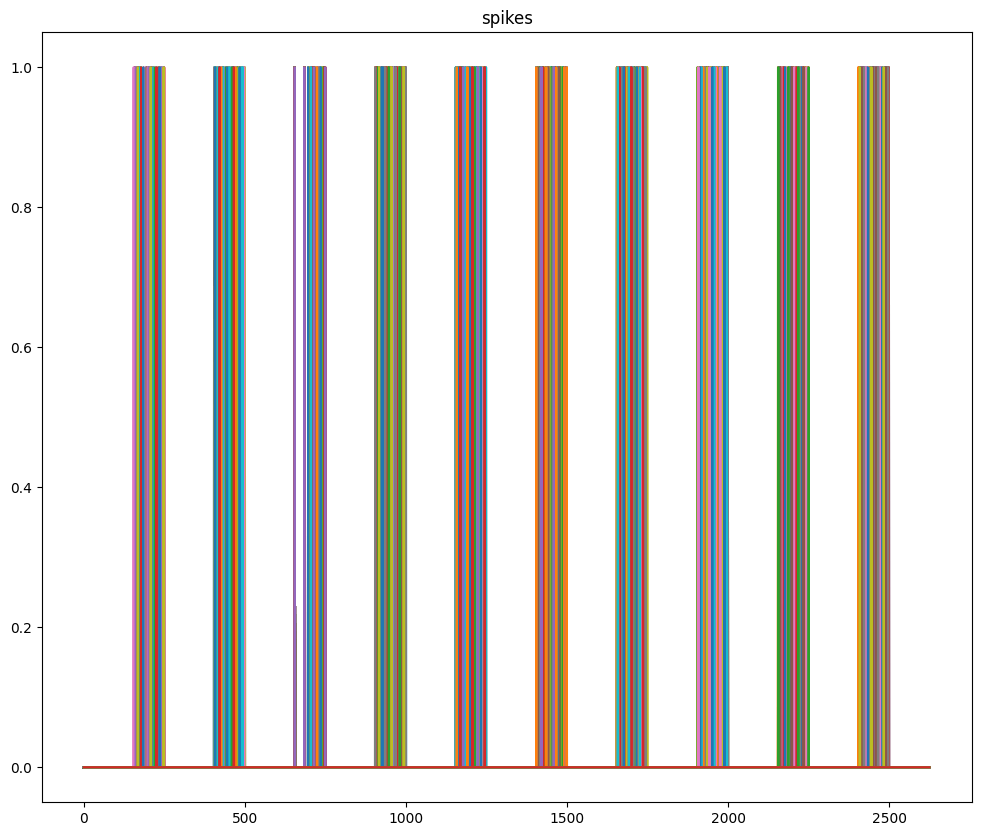

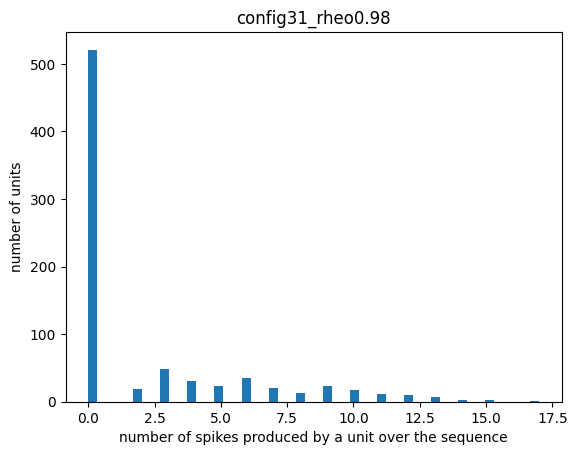

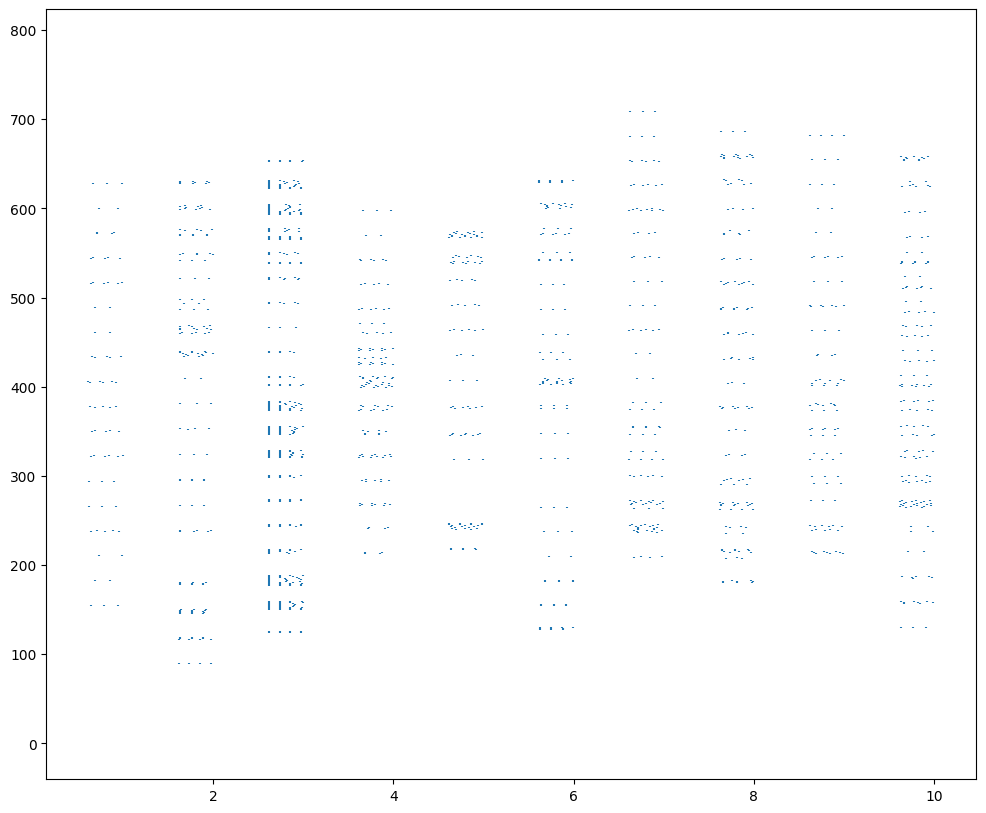

In [7]:
run(dataset_name='mnist_sequences_250hz', configuration_name='config31_rheo0.98', data_multiplier=0.98)

# config25_rheo1.02

ConfigParser: Loading configuration from config25_rheo1.02.txt
Continuing training from file: /home/jupyter-ikharitonov/RANCZLAB-NAS/iakov/produced/mnist_sequence_checkpoints/SNN1_mnist_sequences_250hz/config25_rheo1.02/SNN1_mnist_sequences_250hz_i_0_epoch_5_loss_0.057.pth | starting epoch: 6
615,440 total parameters.
615,440 trainable parameters.
1.0 iterations per epoch.


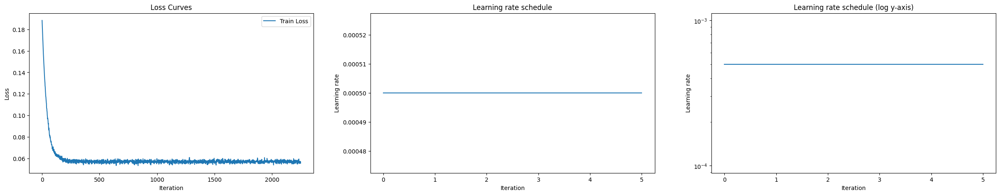

mean tensor(-8.3058e-05, device='cuda:0')
std tensor(0.0004, device='cuda:0')
max tensor(0.0025, device='cuda:0')
min tensor(-0.0077, device='cuda:0')


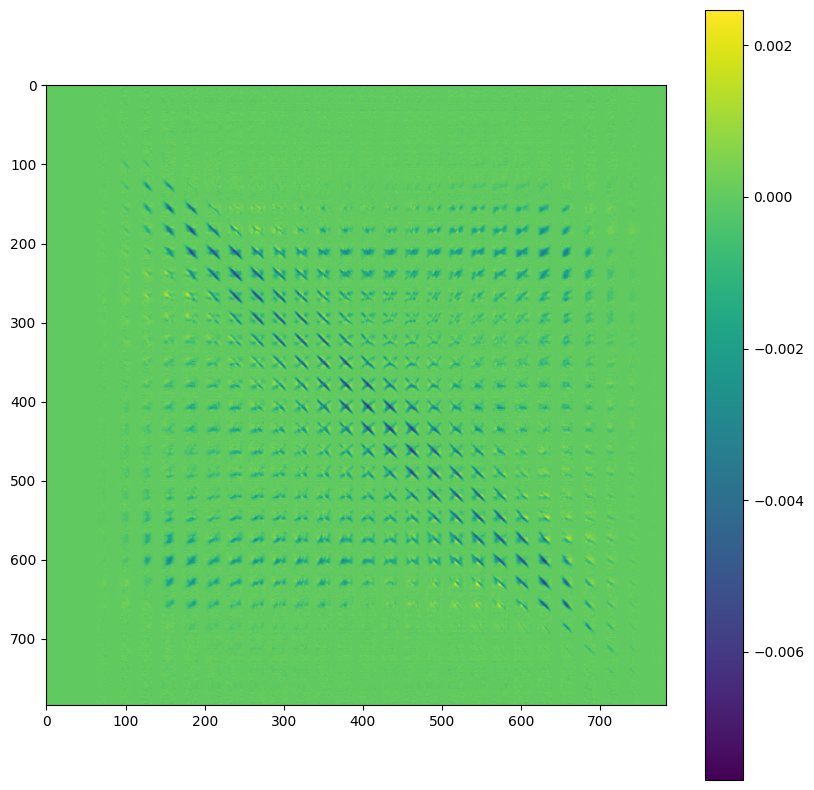

connectivity of unit 350


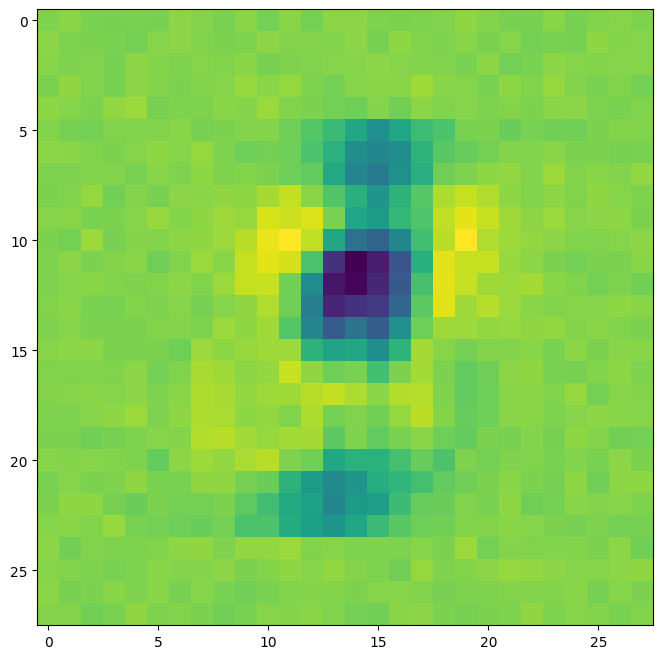

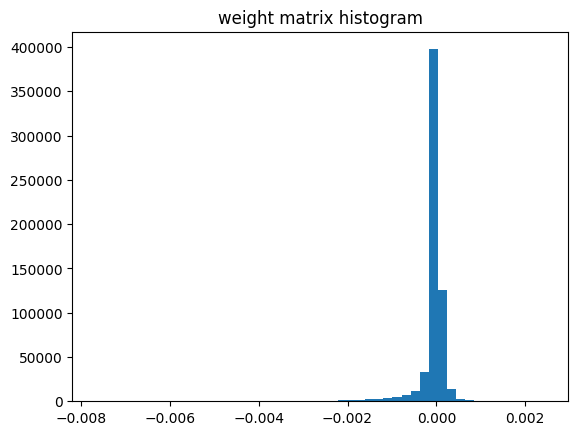

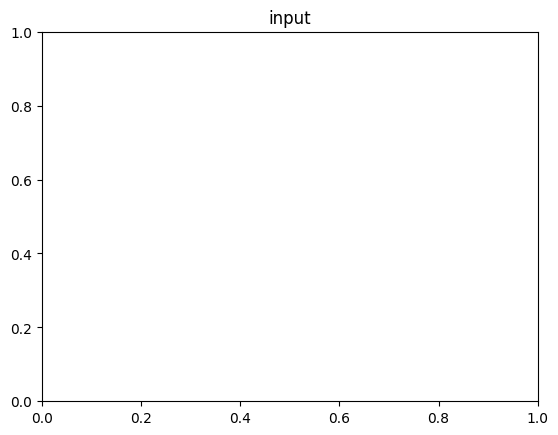

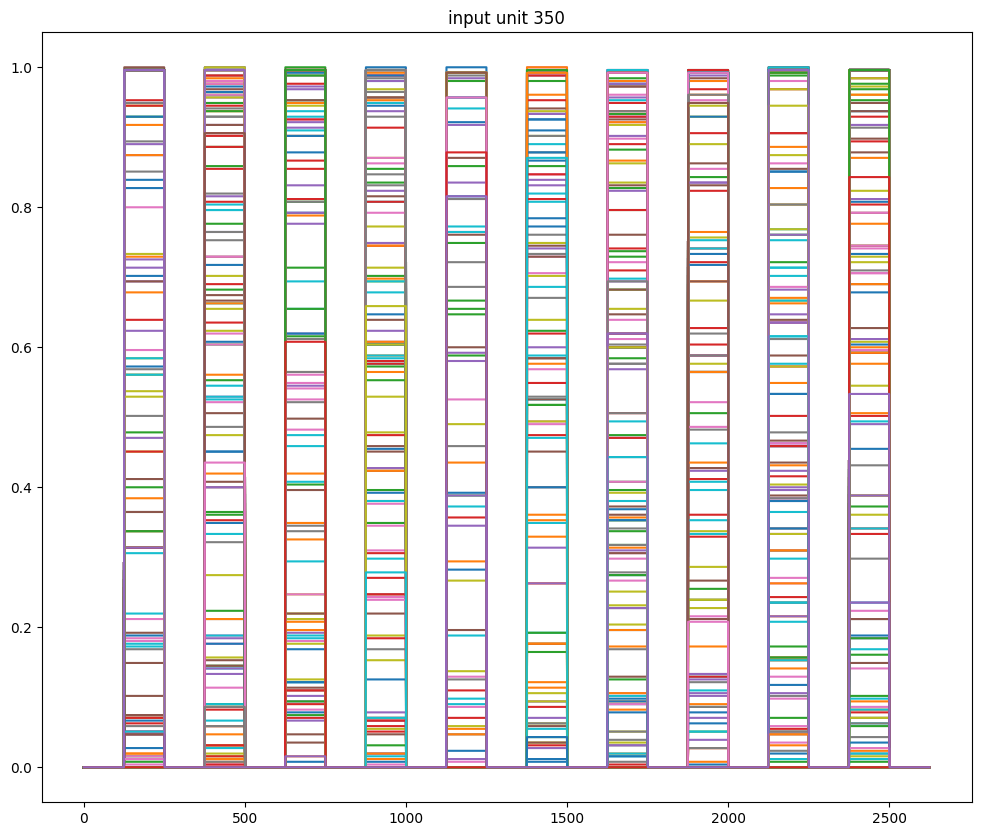

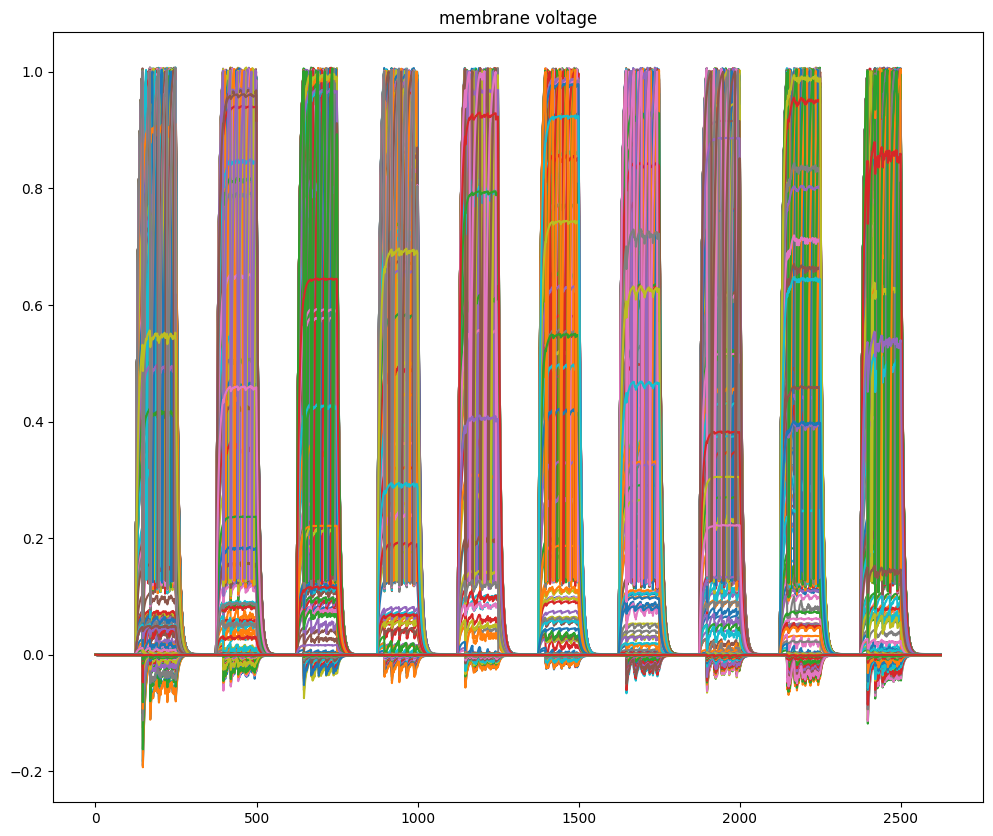

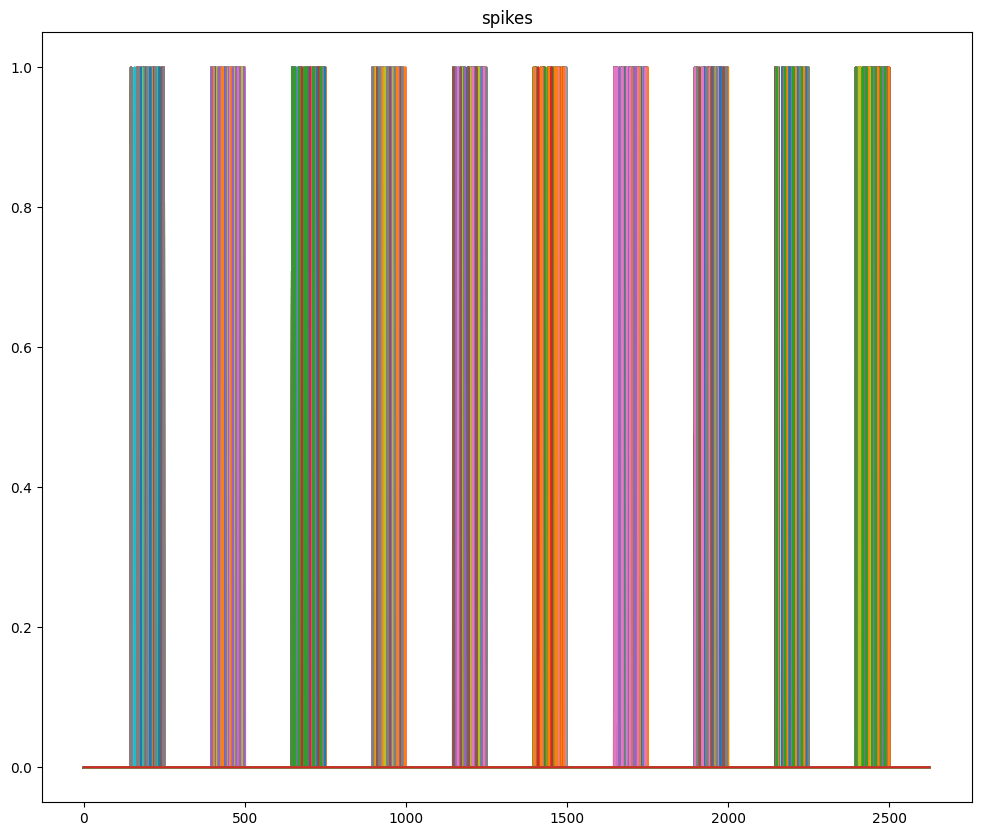

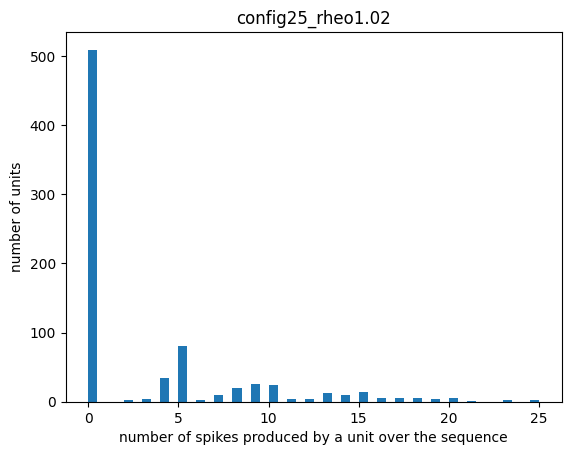

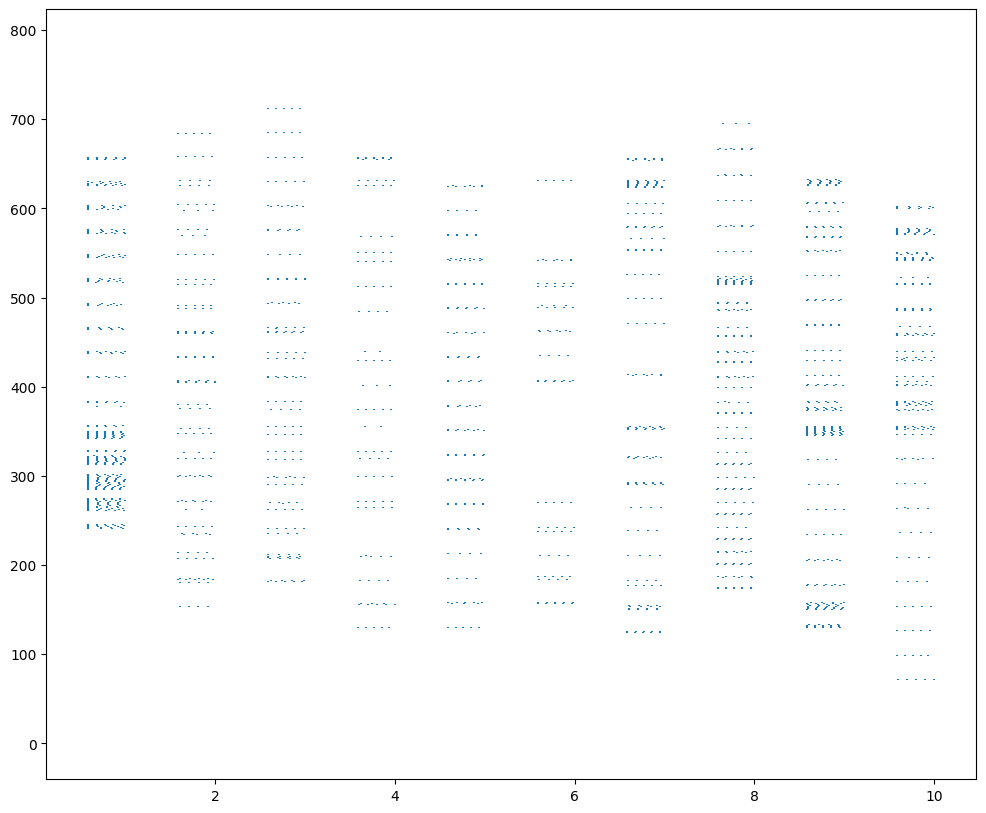

In [8]:
run(dataset_name='mnist_sequences_250hz', configuration_name='config25_rheo1.02', data_multiplier=1.02)

# config10_rheobase_0.7

ConfigParser: Loading configuration from config10_rheobase_0.7.txt
Continuing training from file: /home/jupyter-ikharitonov/RANCZLAB-NAS/iakov/produced/mnist_sequence_checkpoints/SNN1_mnist_sequences_250hz/config10_rheobase_0.7/SNN1_mnist_sequences_250hz_i_0_epoch_49_loss_0.046.pth | starting epoch: 50
615,440 total parameters.
615,440 trainable parameters.
1.0 iterations per epoch.


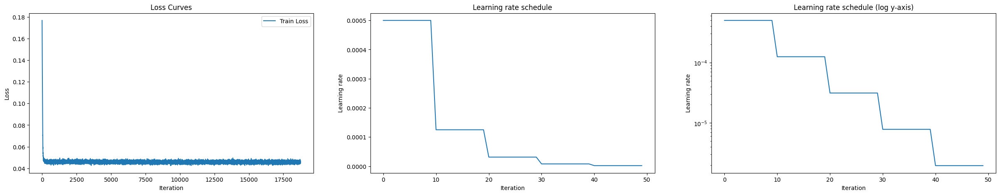

mean tensor(-1.4013e-45, device='cuda:0')
std tensor(0., device='cuda:0')
max tensor(1.0888e-42, device='cuda:0')
min tensor(-1.0888e-42, device='cuda:0')


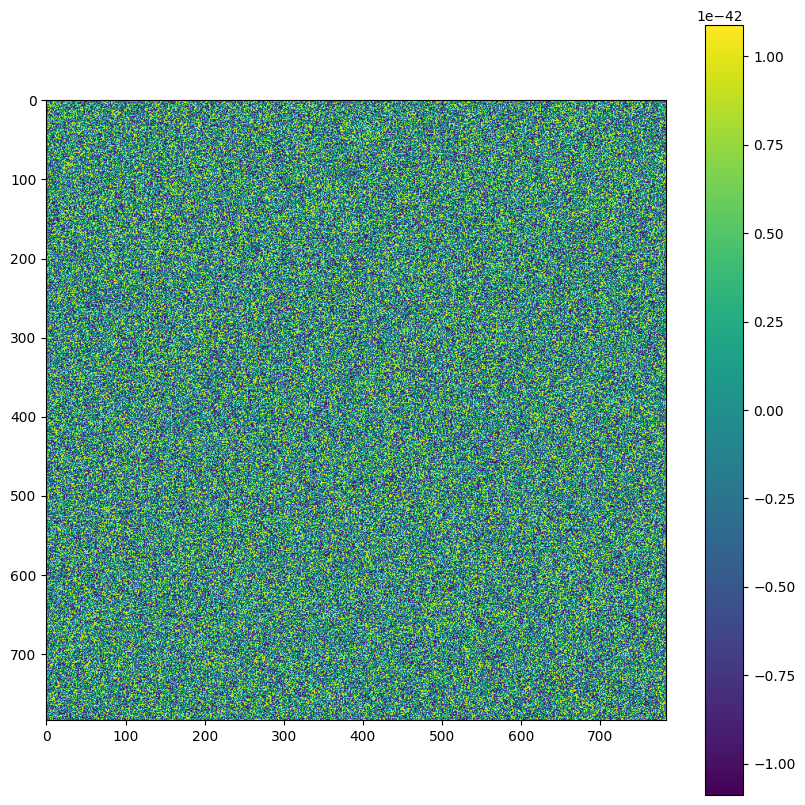

connectivity of unit 350


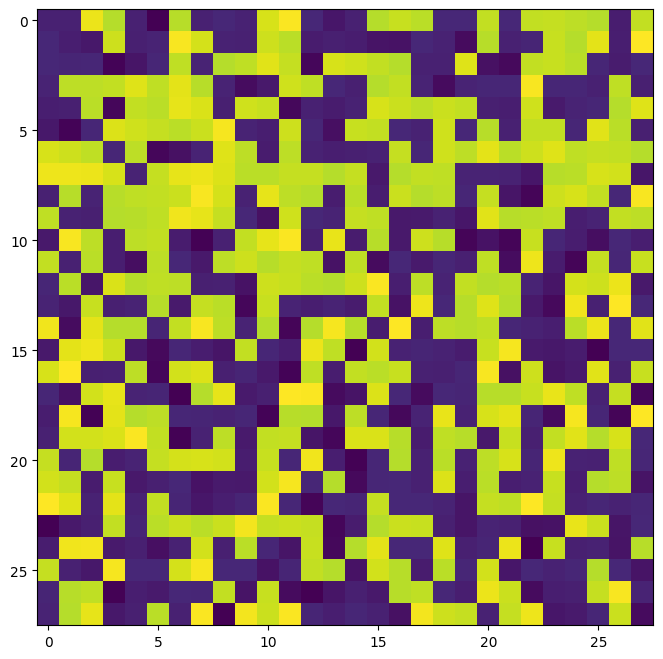

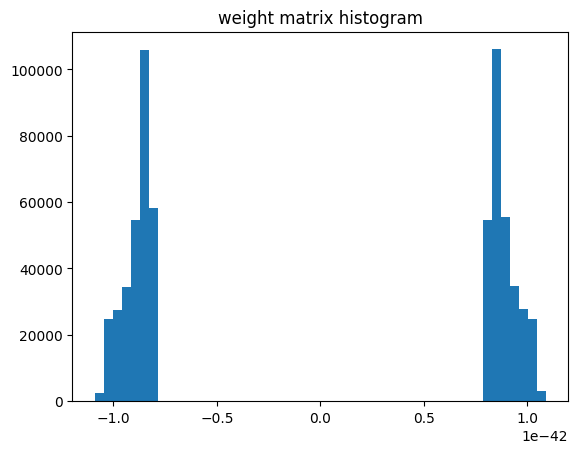

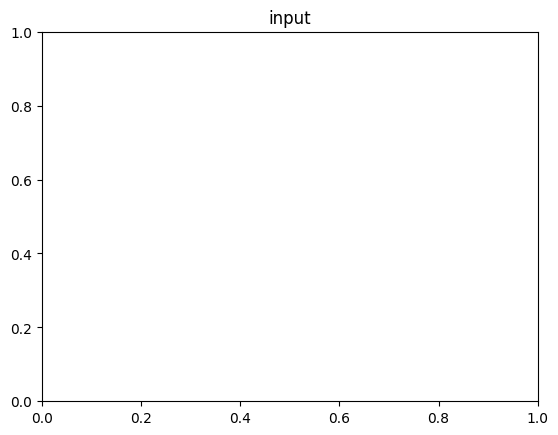

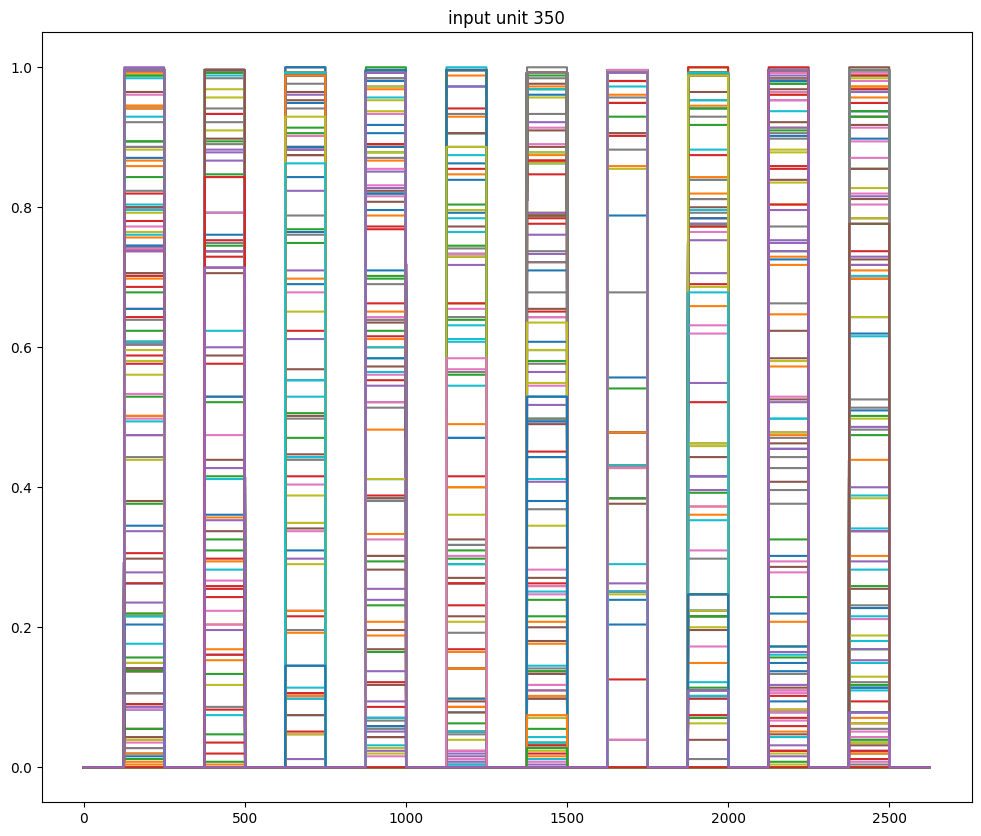

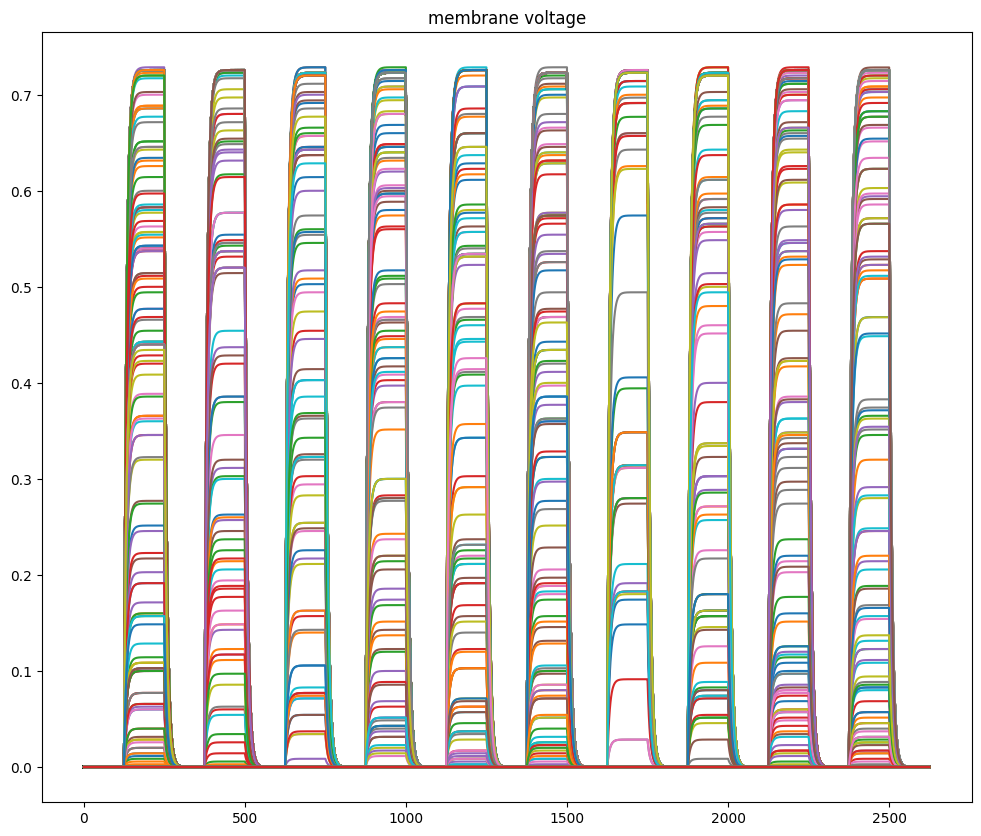

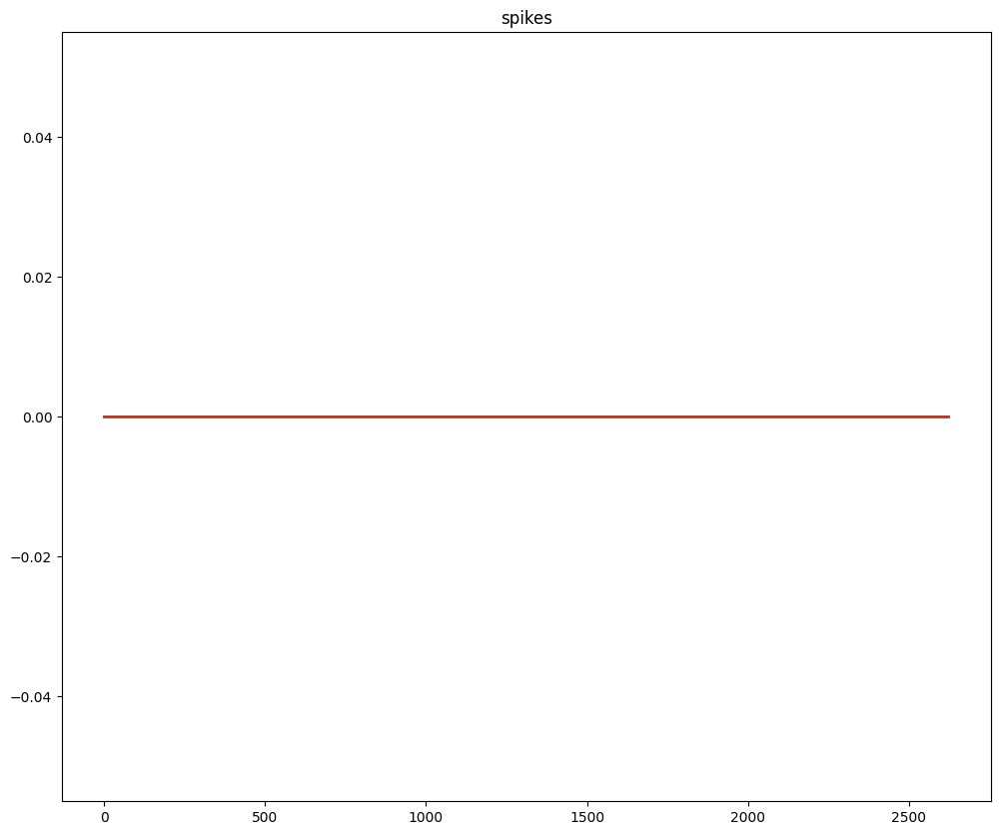

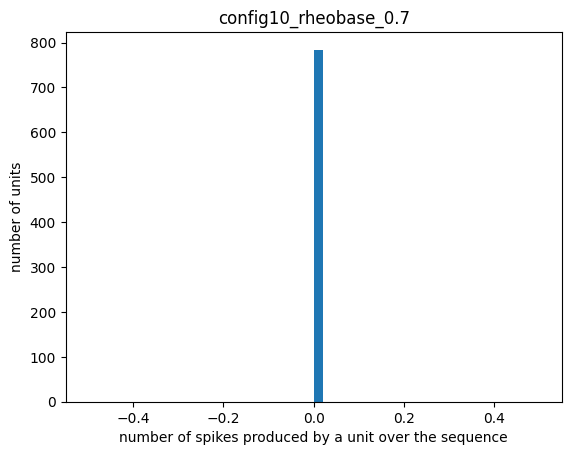

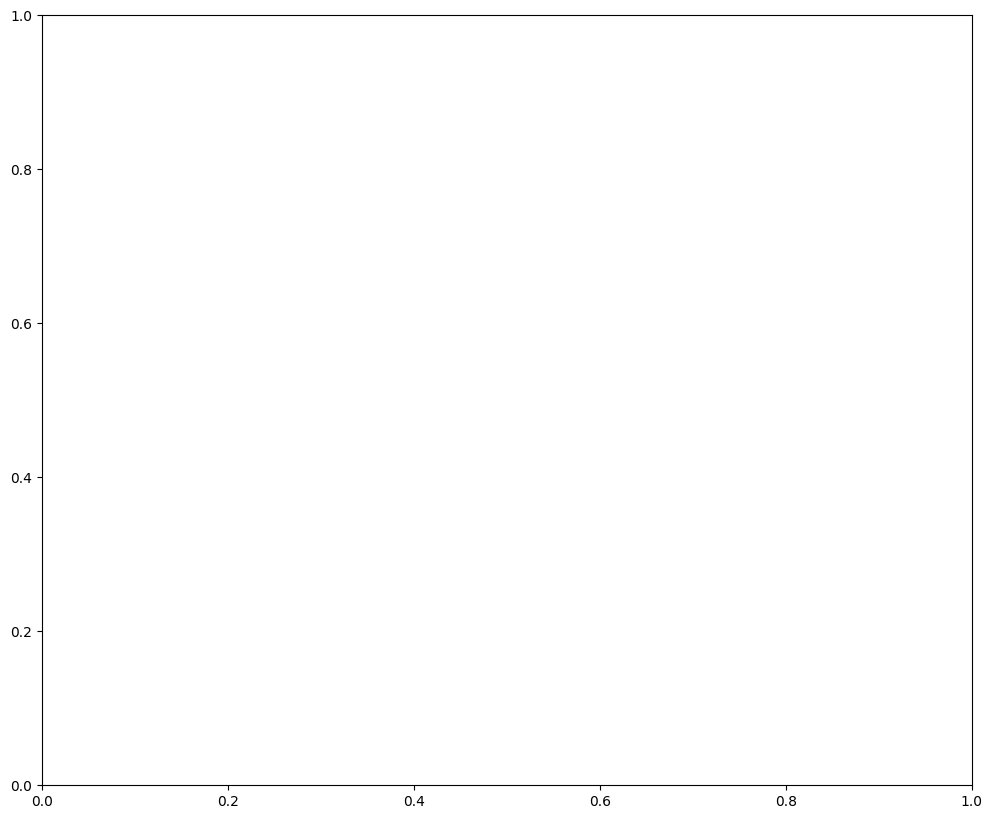

In [10]:
run(dataset_name='mnist_sequences_250hz', configuration_name='config10_rheobase_0.7', data_multiplier=0.7)

# config22_rheobase_2

ConfigParser: Loading configuration from config22_rheobase_2.txt
Continuing training from file: /home/jupyter-ikharitonov/RANCZLAB-NAS/iakov/produced/mnist_sequence_checkpoints/SNN1_mnist_sequences_250hz/config22_rheobase_2/SNN1_mnist_sequences_250hz_i_0_epoch_49_loss_0.294.pth | starting epoch: 50
615,440 total parameters.
615,440 trainable parameters.
1.0 iterations per epoch.


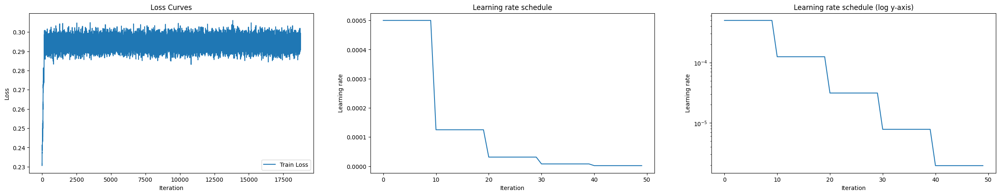

mean tensor(-0.0005, device='cuda:0')
std tensor(0.0190, device='cuda:0')
max tensor(0.1133, device='cuda:0')
min tensor(-0.1348, device='cuda:0')


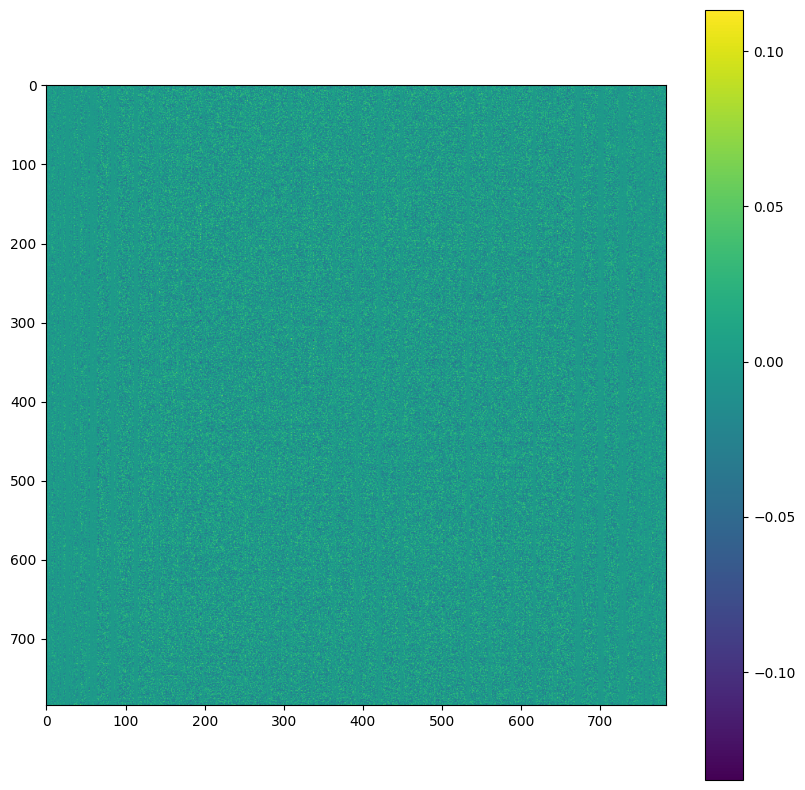

connectivity of unit 350


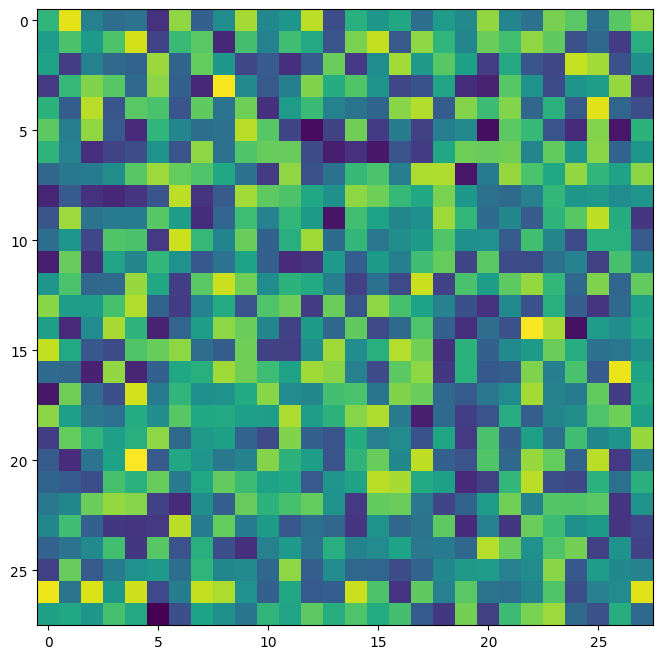

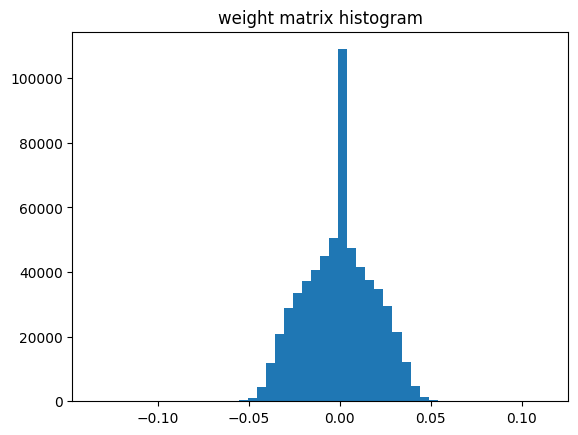

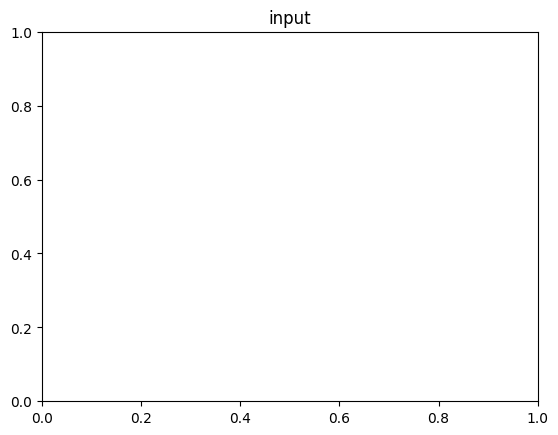

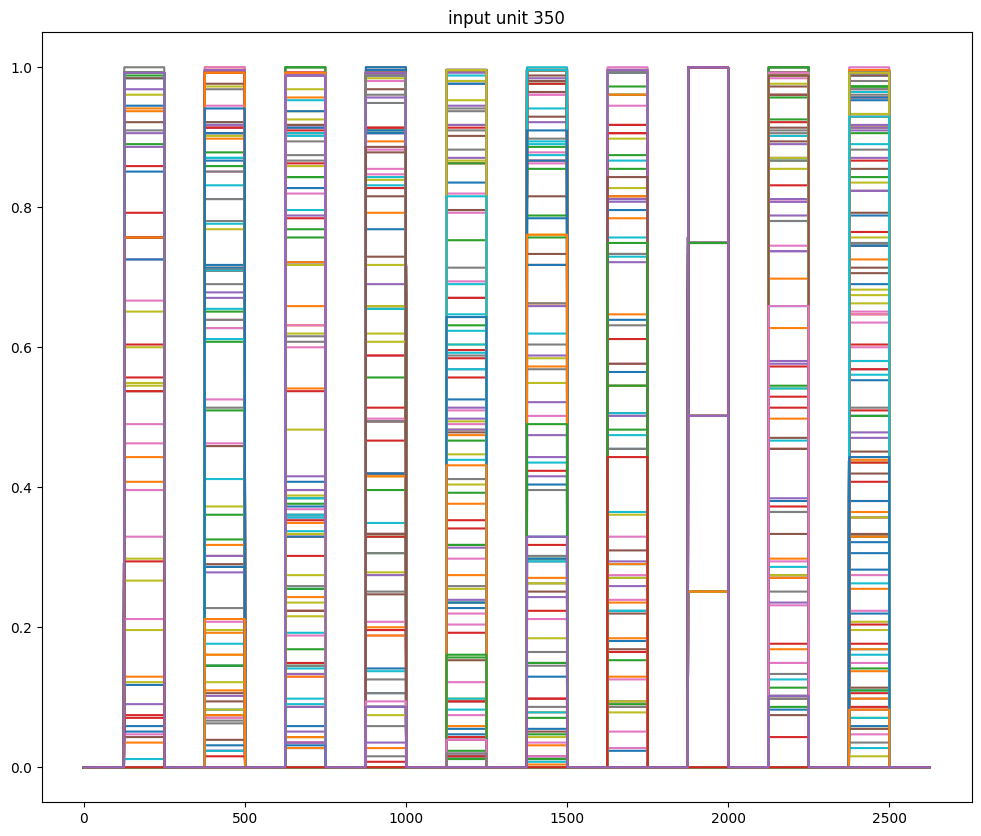

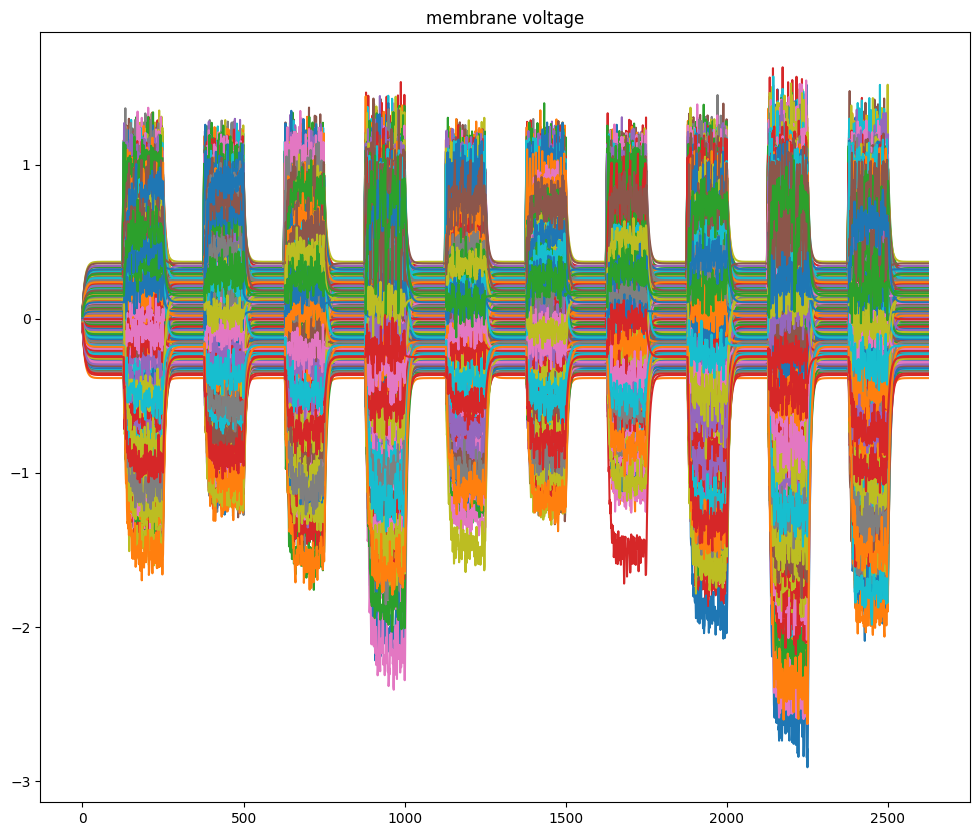

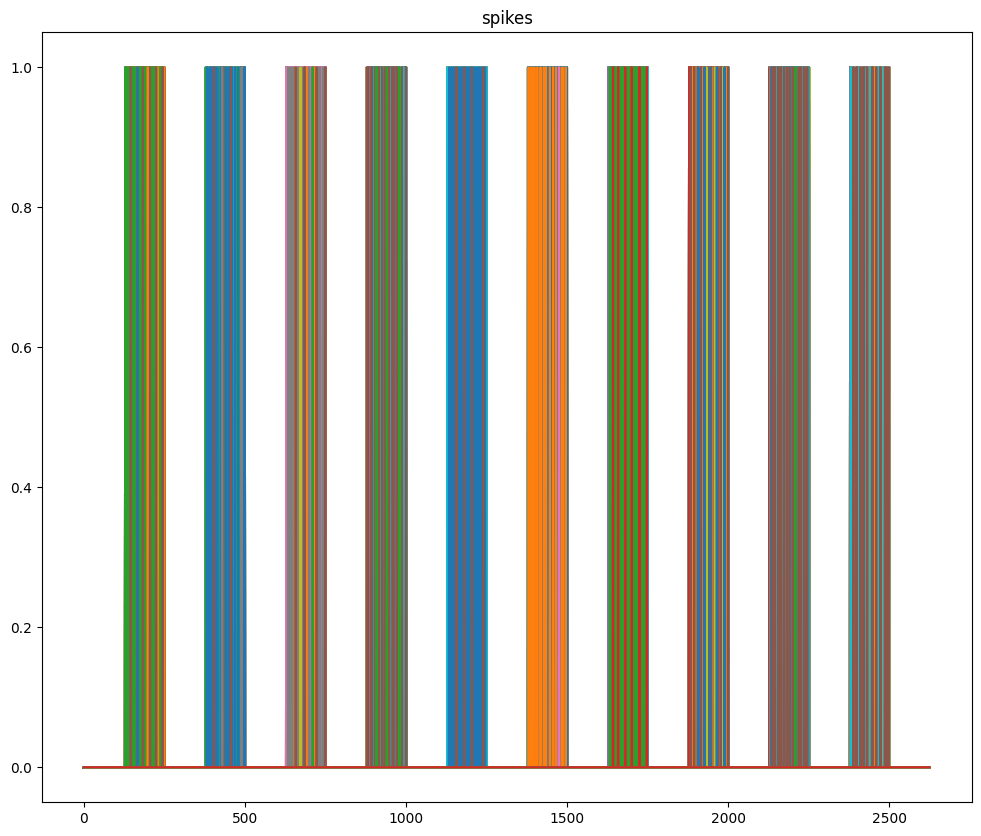

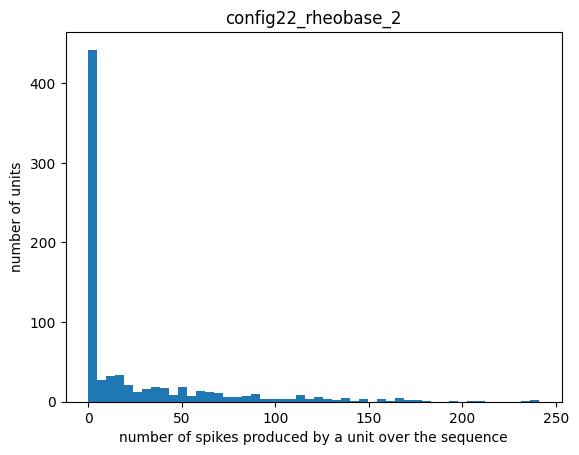

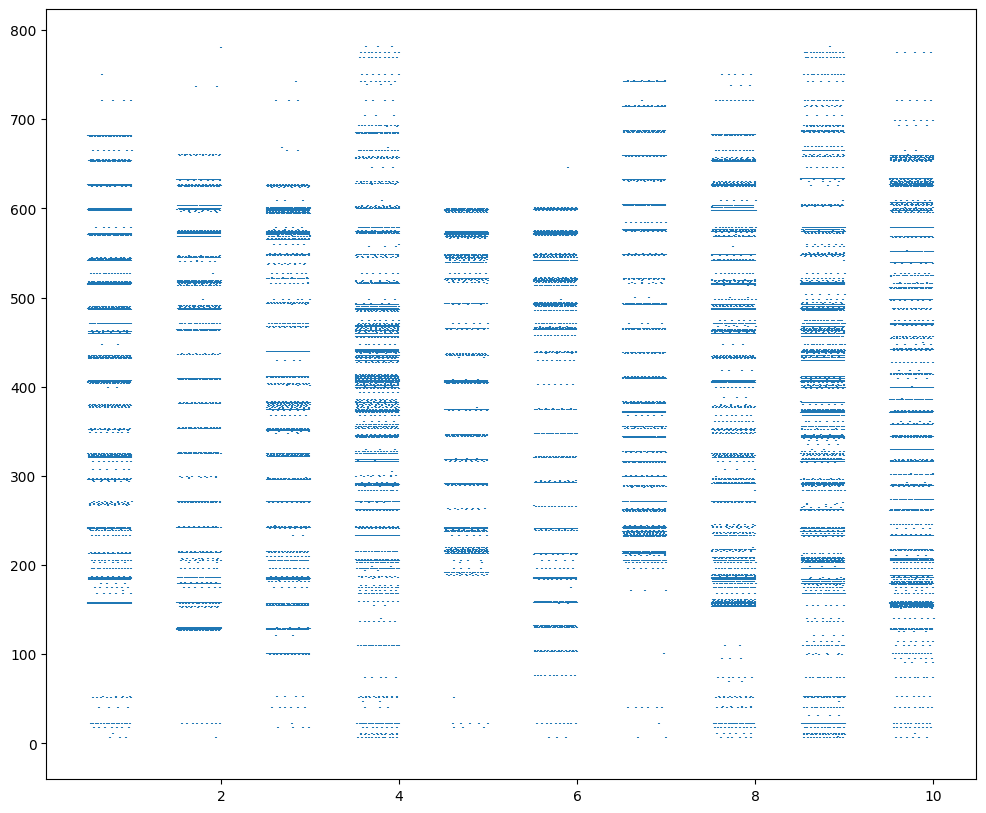

In [11]:
run(dataset_name='mnist_sequences_250hz', configuration_name='config22_rheobase_2', data_multiplier=2)

# config39_config37_batchLRstep (only digits loss)

ConfigParser: Loading configuration from config39_config37_batchLRstep.txt
Continuing training from file: /home/jupyter-ikharitonov/RANCZLAB-NAS/iakov/produced/mnist_sequence_checkpoints/SNN1_mnist_sequences_250hz/config39_config37_batchLRstep/SNN1_mnist_sequences_250hz_i_0_epoch_70_loss_0.198.pth | starting epoch: 71
615,440 total parameters.
615,440 trainable parameters.
1.0 iterations per epoch.


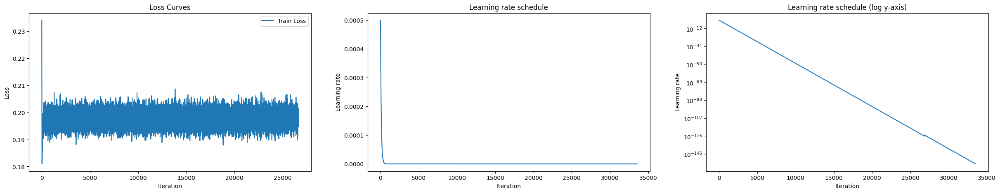

mean tensor(0.0002, device='cuda:0')
std tensor(0.0103, device='cuda:0')
max tensor(0.0480, device='cuda:0')
min tensor(-0.0448, device='cuda:0')


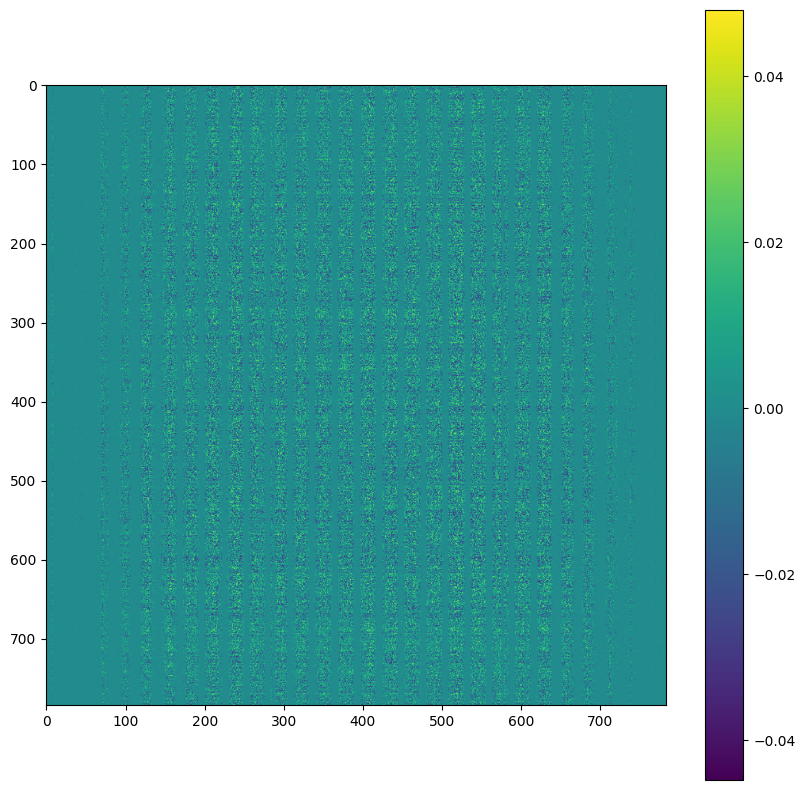

connectivity of unit 350


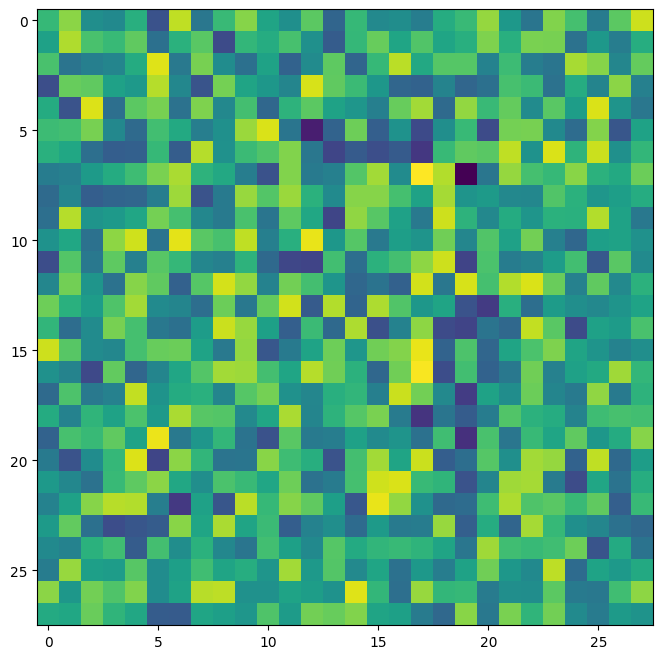

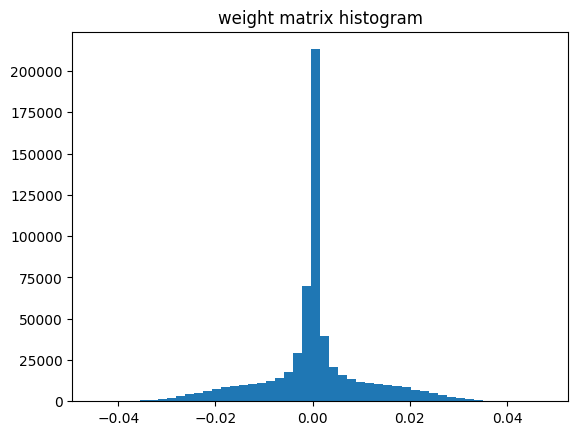

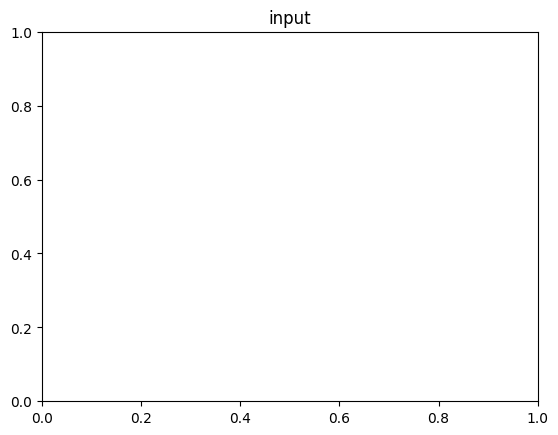

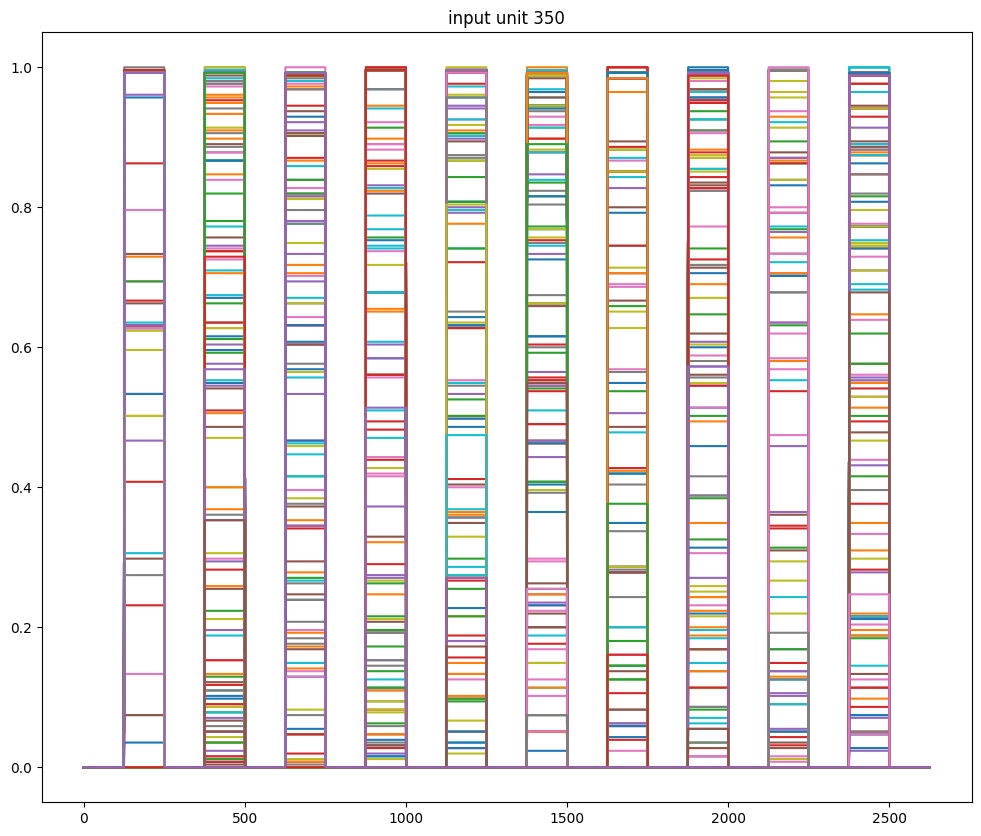

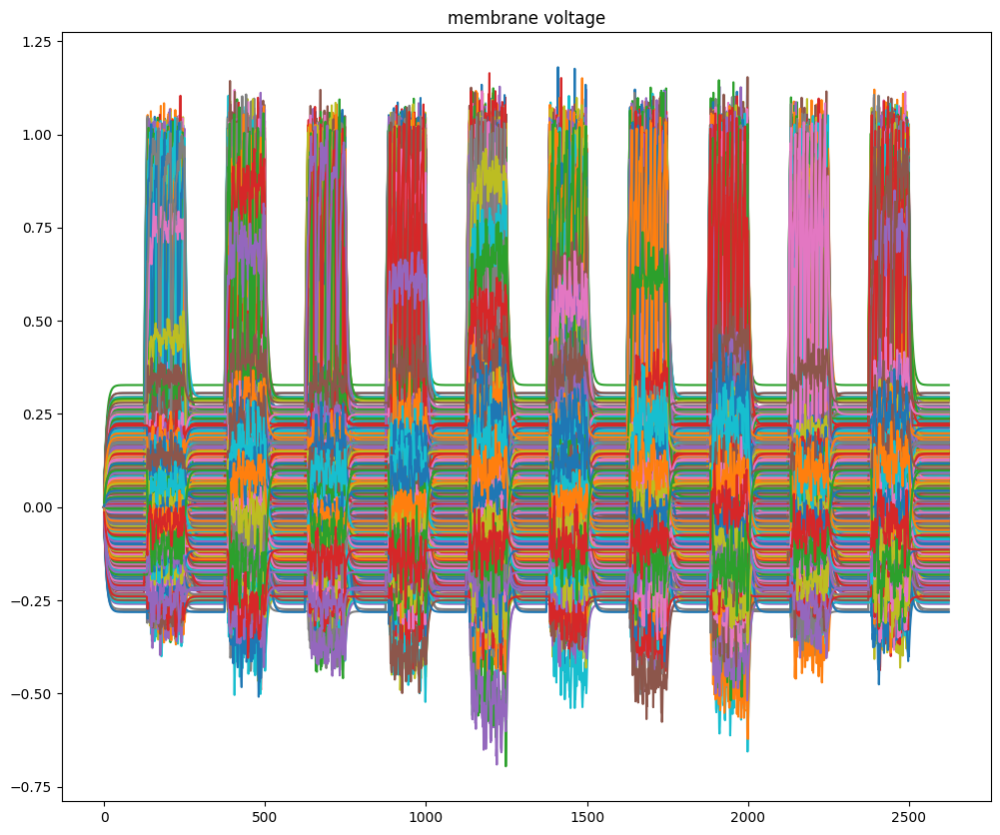

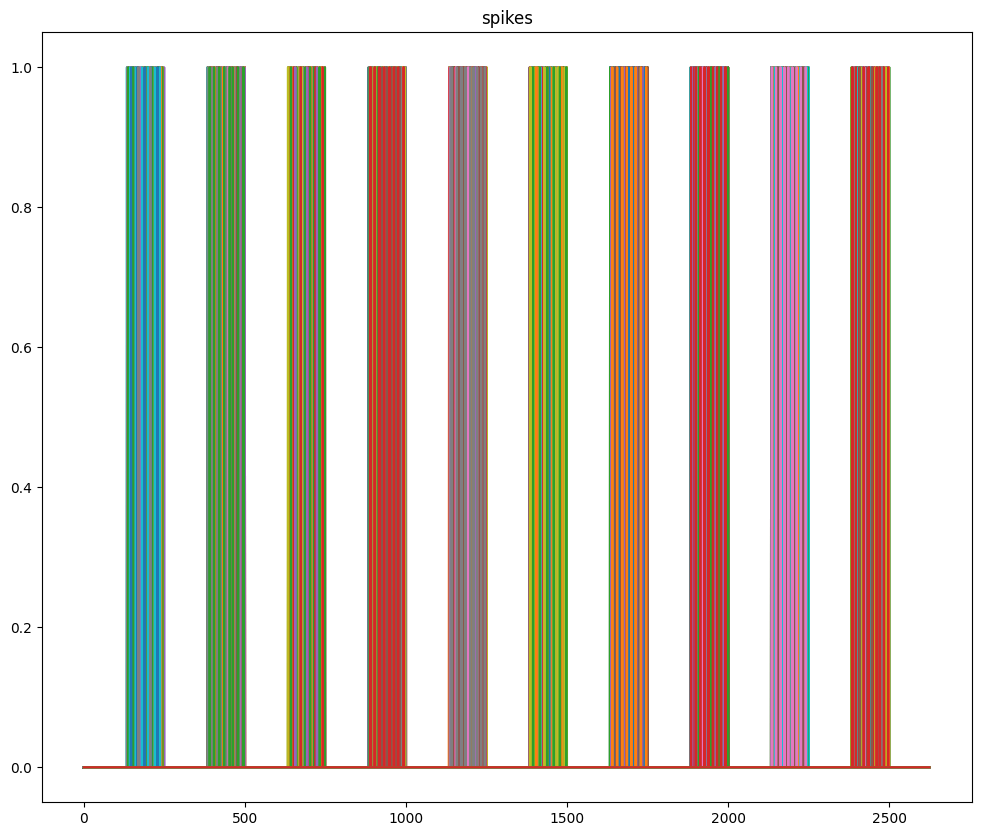

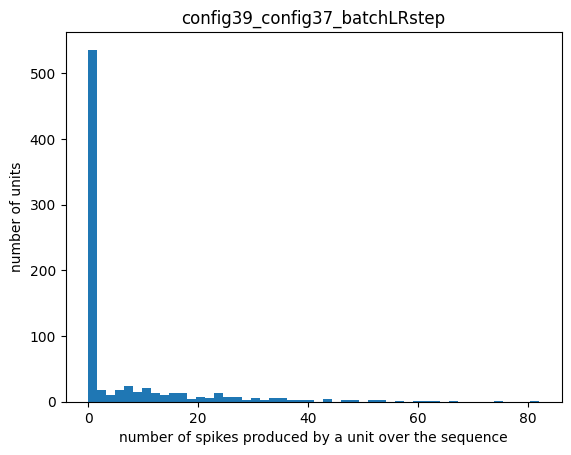

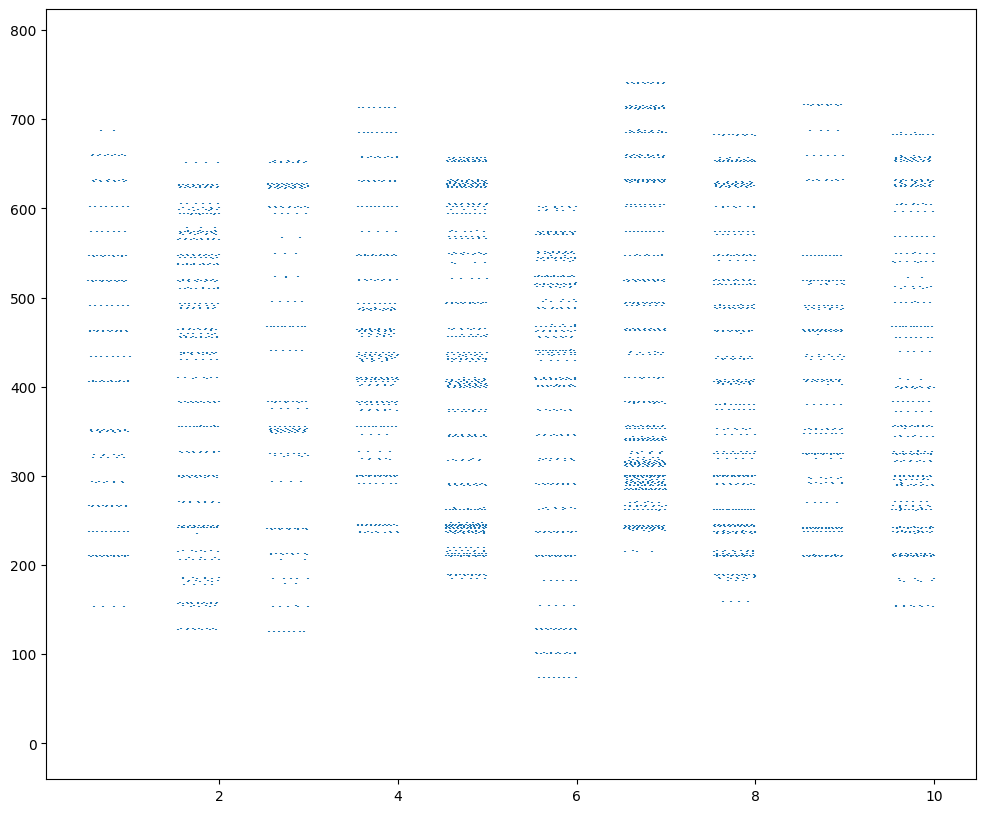

In [12]:
run(dataset_name='mnist_sequences_250hz', configuration_name='config39_config37_batchLRstep', data_multiplier=1)